# Бриф 1. Агентство недвижимости

Задача — разработать сервис для предсказания стоимости домов на основе истории предложений.

Этап 2/3 - Проектирование признаков и подготовка перед подачей в модель

In [1]:
# Импортируем библиотеки
import pandas as pd
import ast
import numpy as np
import re
from datetime import datetime
import ast
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
from tqdm import tqdm
from geopy.distance import geodesic
import category_encoders as ce
from sklearn.model_selection import KFold
from scipy.stats import normaltest
from sklearn.preprocessing import RobustScaler

# Импортируем библиотеку для визуализации
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

In [2]:
# Прочитаем данные и посмотрим как они выглядят
data_0 = pd.read_csv('data_full_cleaned.csv')
data_0 = data_0.drop(['Unnamed: 0'], axis=1)
data_0.head()

,street,homeFacts,city,schools,sqft,zipcode,state,target,status_category,property_type_main,property_type_style,bath_count
0,240 Heather Ln,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",Southern Pines,"[{'rating': ['4', '4', '7', 'NR', '4', '7', 'N...",2900.0,28387,NC,"$418,000",active,single_family,unknown,2.0
1,12911 E Heroy Ave,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",Spokane Valley,"[{'rating': ['4/10', 'None/10', '4/10'], 'data...",1947.0,99216,WA,"$310,000",for_sale,single_family,unknown,3.0
2,2005 Westridge Rd,"{'atAGlanceFacts': [{'factValue': '1961', 'fac...",Los Angeles,"[{'rating': ['8/10', '4/10', '8/10'], 'data': ...",3000.0,90049,CA,"$2,895,000",for_sale,single_family,unknown,2.0
3,4311 Livingston Ave,"{'atAGlanceFacts': [{'factValue': '2006', 'fac...",Dallas,"[{'rating': ['9/10', '9/10', '10/10', '9/10'],...",6457.0,75205,TX,"$2,395,000",for_sale,single_family,unknown,8.0
4,1524 Kiscoe St,"{'atAGlanceFacts': [{'factValue': '', 'factLab...",Palm Bay,"[{'rating': ['4/10', '5/10', '5/10'], 'data': ...",1840.0,32908,FL,"$5,000",for_sale,land,unknown,2.0


Рассмотрим признаки, из которых можно синтезировать новые более информативные 

1. 'homeFacts'

In [3]:
def parse_home_facts(home_facts_str):
    """
    Парсит строку с информацией о характеристиках дома из поля 'homeFacts'.
    
    Аргументы:
        home_facts_str (str): Строка, содержащая словарь с ключом 'atAGlanceFacts',
                              внутри которого список словарей с 'factLabel' и 'factValue'.
                              
    Возвращает:
    
        dict: Словарь с извлечёнными признаками:
            - year_built (int или np.nan)
            - remodeled_year (int или np.nan)
            - heating (str или np.nan)
            - cooling (str или np.nan)
            - parking (str или np.nan)
            - lot_size_sqft (float или np.nan) — площадь участка в квадратных футах
            - price_per_sqft (float или np.nan) — цена за квадратный фут
    """
    # Обрабатываем пустые и некорректные строки
    if not isinstance(home_facts_str, str) or not home_facts_str.strip():
        return {
            'year_built': np.nan,
            'remodeled_year': np.nan,
            'heating': np.nan,
            'cooling': np.nan,
            'parking': np.nan,
            'lot_size_sqft': np.nan,
            'price_per_sqft': np.nan,
        }
    
    # Преобразуем строку в dict 
    try:
        data = ast.literal_eval(home_facts_str)
    except Exception:
        return {
            'year_built': np.nan,
            'remodeled_year': np.nan,
            'heating': np.nan,
            'cooling': np.nan,
            'parking': np.nan,
            'lot_size_sqft': np.nan,
            'price_per_sqft': np.nan,
        }
    
    # Инициализируем словарь с признаками
    features = {
        'year_built': np.nan,
        'remodeled_year': np.nan,
        'heating': np.nan,
        'cooling': np.nan,
        'parking': np.nan,
        'lot_size_sqft': np.nan,
        'price_per_sqft': np.nan,
    }
    
    for item in data.get('atAGlanceFacts', []):
        label = item.get('factLabel', '').lower()
        value = item.get('factValue')
        
        if value in [None, '']:
            value = np.nan
        
        if label == 'year built':
            try:
                features['year_built'] = int(value)
            except (ValueError, TypeError):
                features['year_built'] = np.nan
        
        elif label == 'remodeled year':
            try:
                features['remodeled_year'] = int(value)
            except (ValueError, TypeError):
                features['remodeled_year'] = np.nan
        
        elif label == 'heating':
            features['heating'] = value if pd.notna(value) else np.nan
        
        elif label == 'cooling':
            features['cooling'] = value if pd.notna(value) else np.nan
        
        elif label == 'parking':
            features['parking'] = value if pd.notna(value) else np.nan
        
        elif label == 'lotsize':
            if pd.isna(value):
                features['lot_size_sqft'] = np.nan
            else:
                # Преобразуем размер участка к sqft
                sqft = parse_lotsize(value)
                features['lot_size_sqft'] = sqft
        
        elif label == 'price/sqft':
            if pd.isna(value):
                features['price_per_sqft'] = np.nan
            else:
                price = parse_price_per_sqft(value)
                features['price_per_sqft'] = price
    
    return features


def parse_lotsize(text):
    
    """
    Конвертирует строку с размером участка в площадь в квадратных футах (float).
    
    Поддерживает форматы:
      - "10,000 Sq. Ft."
      - "0.25 acres"
      - "5828 sqft"
      
    Если не удаётся распарсить — возвращает np.nan.
    
    Аргументы:
        text (str): Строка с размером участка.
        
    Возвращает:
        float или np.nan: Площадь участка в квадратных футах.
    """
    
    if not isinstance(text, str):
        return np.nan
    
    text = text.lower().replace(',', '').strip()
    try:
        if 'acre' in text:
            # конвертация acres -> sqft (1 acre = 43560 sqft)
            val = float(re.findall(r'[\d.]+', text)[0])
            return val * 43560
        else:
            # извлекаем число и считаем, что это sqft
            val = float(re.findall(r'[\d.]+', text)[0])
            return val
    except Exception:
        return np.nan


def parse_price_per_sqft(text):
    
    """
    Преобразует цену за квадратный фут из строки в число float.
    
    Форматы на входе могут быть:
      - '$159/sqft'
      - '$159'
      - '159'
      
    Аргументы:
        text (str): Строка с ценой за sqft.
        
    Возвращает:
        float или np.nan: Числовое значение цены за sqft.
    """
    
    if not isinstance(text, str):
        return np.nan
    text = text.replace('$', '').replace('/sqft', '').replace(' ', '').replace(',', '')
    try:
        return float(text)
    except Exception:
        return np.nan


In [4]:
df_home_facts = data_0['homeFacts'].apply(parse_home_facts).apply(pd.Series) # Применяем функцию
data_1 = pd.concat([data_0, df_home_facts], axis=1) # Объеденяем новые признаки со старыми

In [5]:
data_1 = data_1.drop(['homeFacts'], axis=1) # Удаляем старый признак
data_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 374619 entries, 0 to 374618
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   street               374619 non-null  object 
 1   city                 374619 non-null  object 
 2   schools              374619 non-null  object 
 3   sqft                 374619 non-null  float64
 4   zipcode              374619 non-null  object 
 5   state                374619 non-null  object 
 6   target               374619 non-null  object 
 7   status_category      374619 non-null  object 
 8   property_type_main   374619 non-null  object 
 9   property_type_style  374619 non-null  object 
 10  bath_count           374619 non-null  float64
 11  year_built           311410 non-null  float64
 12  remodeled_year       149833 non-null  float64
 13  heating              266036 non-null  object 
 14  cooling              251610 non-null  object 
 15  parking          

Заполним пропуски применив различные стратегии

1.1. 'year_built'

Посмотрим связан ли год постройки с типом объекта и, если некоторая связь будет выявлена, запоним признак в соответствии с этим. Для начала узнаем нет ли в признаке данных нарушающих здравый смысл. 

In [ ]:
# Посмотрим есть ли в новом признаке аномальные значения
data_1['year_built'].value_counts().sort_index()

year_built
1.000000e+00       2
1.019000e+03       1
1.057000e+03       1
1.060000e+03       1
1.208000e+03       1
                ... 
2.020000e+03    2435
2.021000e+03      62
2.022000e+03       8
2.025000e+03       2
5.599906e+11       2
Name: count, Length: 226, dtype: int64

По подсчету значений с увереностью можно сказать, что данные требуют логической предобработки. Ограничим года построек 1800 и 2025 

In [7]:
# Если данные не входят в выбранный диапазон вернем NaN
data_1['year_built'] = data_1['year_built'].apply(lambda x: x if 1800 < x < 2025 else np.nan)

In [8]:
# Сгруппируем данные о годе постройки с его типом
gr_type_year = data_1.groupby('property_type_main')['year_built'].value_counts()
gr_type_year

property_type_main  year_built
apartment           2019.0        45
                    2007.0        24
                    2018.0        24
                    2005.0        23
                    2006.0        22
                                  ..
townhouse           1887.0         1
                    1888.0         1
                    1894.0         1
                    1904.0         1
                    1933.0         1
Name: count, Length: 1523, dtype: int64

In [10]:
# Созданим интерактивную гистограммы с учетом количества объектов
fig_1 = px.scatter(pd.DataFrame(gr_type_year.reset_index()), 
             x='year_built', 
             y='count', 
             color='property_type_main', 
             title='Рисунок 1. Распределение года постройки по типам недвижимости',
             labels={'year_built': 'Год постройки', 'count': 'Частота', 'property_type_main': 'Тип недвижимости'})

fig_1.show()

# Сохраняем в HTML
fig_1.write_html("Картинки/2-3_Рисунок 1.html")

c:\Users\nik-e\AppData\Local\Programs\Python\Python311\Lib\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



Проанализировав распределение частоты построек домов того или иного типа, можно придти к выводу, что в некоторые годы преобладал тот или иной тип постройки. Заполним пропуски в соответствии с типом самым частым значением для данного типа. 

In [11]:
# Функция для заполнения пропусков модой по группам
def fill_numeric_nans_with_group_mode(df, target_col, group_col):
    """
    Заполняет пропущенные значения (NaN) в числовом признаке модой (наиболее частым значением) 
    по группам, определённым другим признаком.

    Параметры:
    ----------
    df : pandas.DataFrame
        Входной датафрейм, содержащий как целевой признак с пропусками, так и группирующий признак.
    
    target_col : str
        Название числового признака, в котором нужно заполнить пропущенные значения.
    
    group_col : str
        Название признака, по которому будут формироваться группы для вычисления моды.

    Возвращает:
    -----------
    pandas.DataFrame
        Копия датафрейма с заполненными значениями в столбце `target_col`.
    
    """
    mode_per_group = df.groupby(group_col)[target_col].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else np.nan)

    def fill_na(row):
        if pd.isna(row[target_col]):
            return mode_per_group.get(row[group_col], row[target_col])
        return row[target_col]

    df[target_col] = df.apply(fill_na, axis=1)
    return df

# Применяем
data_2 = fill_numeric_nans_with_group_mode(data_1, 'year_built', 'property_type_main')


Сам по себе год постройки не несет информационной нагрузки для модели, переведем его в возраст объекта

In [12]:
# Создаем переменную - текущий год 
current_year = datetime.now().year

# Создаем новый признак - возраст
data_2['age'] = current_year - data_2['year_built']

In [13]:
# Удалим признаки где пропусков более 40% и обработанный признак года постройки
data_2 = data_2.drop(['remodeled_year', 'parking', 'year_built'], axis=1)
data_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 374619 entries, 0 to 374618
Data columns (total 16 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   street               374619 non-null  object 
 1   city                 374619 non-null  object 
 2   schools              374619 non-null  object 
 3   sqft                 374619 non-null  float64
 4   zipcode              374619 non-null  object 
 5   state                374619 non-null  object 
 6   target               374619 non-null  object 
 7   status_category      374619 non-null  object 
 8   property_type_main   374619 non-null  object 
 9   property_type_style  374619 non-null  object 
 10  bath_count           374619 non-null  float64
 11  heating              266036 non-null  object 
 12  cooling              251610 non-null  object 
 13  lot_size_sqft        279280 non-null  float64
 14  price_per_sqft       260678 non-null  float64
 15  age              

1.2. 'heating'

In [14]:
# Посмотрим какие записи в признаке встречаются чаще других 
dict(data_2['heating'].value_counts())

{'Forced Air': 82354,
 'Forced air': 51121,
 'Other': 29064,
 'Electric': 10169,
 'Gas': 9263,
 'No Data': 8415,
 'Central Air': 7814,
 'Central Electric': 7112,
 'Central': 6245,
 'Heat Pump': 6076,
 'Central, Electric': 4252,
 'Baseboard': 3771,
 'Wall': 3277,
 'Electric Heat': 3062,
 'Heat pump': 2730,
 'Heating System': 2709,
 'Forced air, Heat pump': 1724,
 'Radiant': 1481,
 'Central Air, Ceiling Fan(s)': 1431,
 'Natural Gas Heat': 1383,
 'Central Furnace': 1036,
 'Forced Air, Gas': 962,
 'Central Electric, Zoned': 873,
 'Forced Air Heating': 810,
 ', Gas Hot Air/Furnace': 776,
 'Gas Heat': 769,
 'Forced Air, Natural Gas': 737,
 'Central Heating': 646,
 'Central Gas': 632,
 'Central Electric, Heat Pump': 517,
 ', Heat Pump - Heat': 499,
 'Central Air Conditioning': 396,
 'Electric, Gas': 356,
 'Forced air, Other': 325,
 'Central, Gas': 317,
 'Refrigeration': 255,
 'Central, Electric, Heat Pump': 241,
 'Refrigeration, Ceiling Fan(s)': 239,
 'Oil': 217,
 'Central, Heat Pump': 207,
 

In [15]:
# Заменим пропуски на пустую строку
data_2['heating'] = data_2['heating'].fillna('')

# Очистим текст от лишнего (цифры, знаки препинания и т.д.)
def preprocess(text):
    """Обработка текстового признака 
    
    Аргументы:
        text (str): Строка с  описанием
        
    Возвращает:
        text (str): Обработанная строка
    
    """
    
    text = text.lower()                          # в нижний регистр
    text = re.sub(r'[^a-zа-яё\s]', '', text)     # убрать всё кроме букв и пробелов
    text = re.sub(r'\s+', ' ', text).strip()     # убрать лишние пробелы
    return text

data_2['heating'] = data_2['heating'].apply(preprocess)
data_2['heating'].value_counts()

heating
forced air                                                   133476
                                                             108590
other                                                         29064
central electric                                              11364
electric                                                      10175
                                                              ...  
genergy star hvac gas hot airfurnace multizone heat               1
closet behind bike storagefl central                              1
energy star qualified equipment                                   1
radiant floor radiator stove pellet                               1
baseboard hot water programmable thermostat radiant floor         1
Name: count, Length: 1823, dtype: int64

In [16]:
# Ключевые слова для категорий
categories_keywords = {
    'forced_air': ['forced air', 'forcedair', 'forced air heating', 'forced warm air', 'hot air', 'gas hot air', 'forced air heating'],
    'electric': ['electric', 'electric heat', 'electric heating', 'electric baseboard', 'closet-electric', 'electric source', 'electric electric', 'electric cooling'],
    'gas': ['gas', 'natural gas', 'gas heat', 'propane', 'liquid propane', 'gas hot air', 'gas water heater', 'gas furnace', 'garage-gas'],
    'heat_pump': ['heat pump', 'heatpump', 'heat pump heat', 'heat pump - heat', 'heat pump electric backup'],
    'central': ['central', 'central air', 'central electric', 'central heating', 'central furnace', 'central cooling', 'central gas'],
    'baseboard': ['baseboard', 'baseboard hot water', 'baseboard electric', 'baseboard radiant'],
    'radiant': ['radiant', 'radiator', 'hot water', 'steam heating', 'hot water/steam', 'hot water/steam radiators', 'hot water/radiator heating'],
    'wall': ['wall', 'wall heater', 'wall furnace', 'wall/window unit', 'wall/window units', 'wall unit heating', 'wall gas', 'wall/window unit(s)', 'wall units'],
    'oil': ['oil', 'oil propane', 'oil wood'],
    'refrigeration': ['refrigeration'],
    'other': ['other', 'no data', 'none', 'unknown', 'heating system', 'heating'],
}

# Функция категоризации (выбираем первую подходящую категорию)
def categorize(text):
    """Категоризирует описание по ключевым словам
    
    Аргументы:
        text (str): Строка с  описанием
        
    Возвращает:
        text (str): Категория
    
    """
    for cat, keywords in categories_keywords.items():
        for kw in keywords:
            if kw in text:
                return cat
    return 'unknown'
data_2['heat_cat'] = data_2['heating'].apply(categorize)
data_2['heat_cat'].value_counts()

heat_cat
forced_air       141957
unknown          109660
other             40606
electric          28826
central           18669
gas               13972
heat_pump         10077
baseboard          4131
wall               3886
radiant            1988
refrigeration       585
oil                 262
Name: count, dtype: int64

In [17]:
data_2 = data_2.drop(['heating'],axis=1) # Удалим обработанный признак 
data_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 374619 entries, 0 to 374618
Data columns (total 16 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   street               374619 non-null  object 
 1   city                 374619 non-null  object 
 2   schools              374619 non-null  object 
 3   sqft                 374619 non-null  float64
 4   zipcode              374619 non-null  object 
 5   state                374619 non-null  object 
 6   target               374619 non-null  object 
 7   status_category      374619 non-null  object 
 8   property_type_main   374619 non-null  object 
 9   property_type_style  374619 non-null  object 
 10  bath_count           374619 non-null  float64
 11  cooling              251610 non-null  object 
 12  lot_size_sqft        279280 non-null  float64
 13  price_per_sqft       260678 non-null  float64
 14  age                  374619 non-null  float64
 15  heat_cat         

1.3 'cooling'

Сделаем признак бинарным, показывающим наличие или отсутствие системы охлаждения 

In [18]:
def has_cooling(system_name):
    """Обработка текстового признака 
    
    Аргументы:
        text (str): Строка с  описанием
        
    Возвращает:
        True/False (bool): Наличие системы охлаждения 
    
    """
    
    name = str(system_name).lower()
    
    cooling_keywords = [
        'central', 'air', 'cool', 'refrigeration', 'a/c', 'conditioning',
        'fan', 'evaporative', 'window', 'wall', 'heat pump'
    ]
    
    if any(word in name for word in cooling_keywords):
        return 1
    else:
        return 0

data_2['cooling_cod'] = data_2['cooling'].apply(has_cooling)
data_2['cooling_cod'].value_counts()

cooling_cod
1    228070
0    146549
Name: count, dtype: int64

In [19]:
data_2 = data_2.drop(['cooling'], axis=1) # Удаляем обработанный признак

1.4 'lot_size_sqft'

In [20]:
data_2['lot_size_sqft'].value_counts().sort_index() # Найдем есть ли в признаке аномальные значения

lot_size_sqft
2.300000e-01    172
2.400000e-01     26
2.500000e-01     11
2.600000e-01     10
2.700000e-01     11
               ... 
1.045508e+09      1
1.859533e+09      1
2.147480e+09      1
2.147484e+09      1
2.147484e+09      1
Name: count, Length: 18711, dtype: int64

Очевидно, что значения менее 300 кв.футов и более 15 000 кв.футов не логичны, ограничим данные 

In [21]:
data_2['lot_size_sqft'] = data_2['lot_size_sqft'].apply(lambda x: x if 300 < x < 15000 else np.nan) # Несоответствия заполнятся пропусками

In [22]:
# Сгруппируем данные о площади участка по типу объекта
gr_type_lotsize = data_2.groupby('property_type_main')['lot_size_sqft'].value_counts()
# Создание интерактивной гистограммы с учетом количества объектов
fig_2 = px.scatter(pd.DataFrame(gr_type_lotsize.reset_index()), 
             x='lot_size_sqft', 
             y='count', 
             color='property_type_main', 
             title='Рисунок 2. Распределение площади постройки по типам недвижимости',
             labels={'lot_size_sqft': 'Площадь постройки, кв.фут', 'count': 'Частота', 'property_type_main': 'Тип недвижимости'})

fig_2.show()

# Сохраняем в HTML
fig_2.write_html("Картинки/2-3_Рисунок 2.html")

c:\Users\nik-e\AppData\Local\Programs\Python\Python311\Lib\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



На рисунке 3, очевидно, не наблюдаем четкой зависимости площади объекта от типа недвижимости, но в целом сравнивая типы можно выделить среднее значения для каждого типа и заполнить пропуски в соответствии с этим значением.

In [23]:
data_2['lot_size_sqft'] = data_2.groupby('property_type_main')['lot_size_sqft'].transform(lambda x: x.fillna(x.mean()))

Теперь у нас есть два признака, отражающих площадь объекта сравним их, чтобы понимать какая информационная нагрузка на каждом из признаков

In [24]:
# Вычисляем разницу
df = pd.DataFrame()
df['Разница'] = data_2['sqft'] - data_2['lot_size_sqft']

# Строим интерактивный график расределения разницы между двумя признаками площади 
fig_3 = px.histogram(
    df,
    x='Разница',
    nbins=20,
    title='Рисунок 3. Распределение разницы между sqft и lot_size_sqft',
    labels={'Разница': 'sqft - lot_size_sqft'}
)
fig_3.update_layout(bargap=0.2)
fig_3.show()

# Сохраняем в HTML
fig_3.write_html("Картинки/2-3_Рисунок 3.html")

На рисунке 4 видно, что в среднем данные в двух признаках различаются на 5000 кв.фут, при этом sqft как правило меньше lot_size_sqft. Посмотрим на связь признака с целевым. 

In [25]:
# Преобразуем целевой признак к числовому формату
# Удалим $, запятые, плюсы, пробелы и любые нежелательные символы
data_2['target'] = (
    data_2['target']
    .astype(str)
    .str.replace(r'[^\d.]', '', regex=True)  # оставляем только цифры и точку
    .replace('', np.nan)                     # заменим пустые строки на NaN
    .astype(float)                           # приводим к числу с плавающей точкой
)

data_2['target'].value_counts()

target
225000.0    1806
275000.0    1650
250000.0    1644
350000.0    1641
325000.0    1562
            ... 
752911.0       1
73360.0        1
455740.0       1
198070.0       1
171306.0       1
Name: count, Length: 34229, dtype: int64

In [26]:
# 1. Корреляция
print("Корреляция с ценой:")
print("Площадь_1:", data_2['sqft'].corr(data_2['target']))
print("Площадь_2:", data_2['lot_size_sqft'].corr(data_2['target']))

# 2. Простая линейная регрессия
X1 = data_2[['sqft']]
X2 = data_2[['lot_size_sqft']]
y = data_2['target']

model1 = LinearRegression().fit(X1, y)
model2 = LinearRegression().fit(X2, y)

print("\nR² только sqft:", model1.score(X1, y))
print("R² только lot_size_sqft:", model2.score(X2, y))

# 4. Множественная регрессия с двумя признаками
X_both = data_2[['sqft', 'lot_size_sqft']]
model_both = LinearRegression().fit(X_both, y)
print("R² по обеим площадям:", model_both.score(X_both, y))


Корреляция с ценой:
Площадь_1: 0.3391054182898456
Площадь_2: -0.017276600843868437

R² только sqft: 0.11499248471353074
R² только lot_size_sqft: 0.00029848093671858145
R² по обеим площадям: 0.12352058251174991


Подводя итог можно предположить, что: 

* sqft (скорее всего жилая площадь) — даёт некоторую предсказательную силу, хотя и довольно слабую (≈11.5% объяснённой дисперсии в цене).

* lot_size_sqft (скорее всего площадь участка) — практически не объясняет цену, R² ≈ 0.

* Использование обоих признаков даёт небольшое улучшение (с 0.115 → 0.124), но вклад участка минимален.

Пока что оставим оба признака 

1.5 'price_per_sqft' 

Воспользуемся методами предсказания для заполнения пропусков в данном признаке на основе других, выделенных из homefacts

In [27]:
# Закодируем категориальный признак 
data_2 = pd.get_dummies(data_2, columns=['heat_cat'], prefix='heat')

In [28]:
data_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 374619 entries, 0 to 374618
Data columns (total 27 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   street               374619 non-null  object 
 1   city                 374619 non-null  object 
 2   schools              374619 non-null  object 
 3   sqft                 374619 non-null  float64
 4   zipcode              374619 non-null  object 
 5   state                374619 non-null  object 
 6   target               374619 non-null  float64
 7   status_category      374619 non-null  object 
 8   property_type_main   374619 non-null  object 
 9   property_type_style  374619 non-null  object 
 10  bath_count           374619 non-null  float64
 11  lot_size_sqft        374619 non-null  float64
 12  price_per_sqft       260678 non-null  float64
 13  age                  374619 non-null  float64
 14  cooling_cod          374619 non-null  int64  
 15  heat_baseboard   

In [29]:
# Выделим признаки для обучения, используем группу из homefacts
features = ['heat_baseboard','heat_central', 'heat_electric', 'heat_forced_air',
            'heat_gas', 'heat_heat_pump', 'heat_oil', 'heat_other', 'heat_radiant', 
            'heat_refrigeration', 'heat_unknown', 'heat_wall', 
            'cooling_cod', 'age', 'lot_size_sqft'
]

target = 'price_per_sqft'

# Разделяем данные на train (где целевой признак заполнен) и test (где пропуски)
train_df = data_2[data_2[target].notna()]
test_df = data_2[data_2[target].isna()]

# Признаки и целевой признак для обучения
X_train = train_df[features]
y_train = train_df[target]

# Для теста — только признаки
X_test = test_df[features]

# Обучаем модель
model = RandomForestRegressor(random_state=42, n_estimators=100)
model.fit(X_train, y_train)

# Предсказываем пропуски
predicted_values = model.predict(X_test)

# Заполняем пропуски предсказанными значениями
data_2.loc[data_2[target].isna(), target] = predicted_values

print("Пропуски заполнены!")


Пропуски заполнены!


2. 'schools'

Преобразуем исходный признак в 5 новых: 

* Средний рейтинг школ

* Среднее расстрояние до школ 

* Минимальный рейтинг 

* Максимальный рейтинг 

* Соотношение школ с выскоми рейтингом к школам с плохим (обозначим, что "плохой" рейтинг <4, "хороший" > 7)

In [30]:
def clean_rating(r):
    """ Преобразует значение рейтинга школы в целое число или None. 
        Удаляет некорректные значения вроде 'NR', 'None', None.
    """
    if r in ['NR', 'None', None]:  # Пропущенные или нерелевантные значения
        return None
    match = re.search(r'\d+', str(r))  # Ищем первое число в строке
    return int(match.group()) if match else None  # Возвращаем как int или None

def clean_distance(d):
    """ Преобразует значение расстояния до школы в float или None. """
    if d is None:
        return None
    match = re.search(r'[\d.]+', str(d))  # Ищем число с точкой (например, '1.2 mi')
    return float(match.group()) if match else None  # Возвращаем как float или None

def add_school_features(df, column_name='schools'):
    """
    Вычисляет и добавляет в DataFrame числовые признаки, основанные на информации о школах:
    - Средний рейтинг школ рядом с объектом
    - Среднее расстояние до них
    - Кол-во хороших (рейтинг >=7) и плохих (рейтинг <=4) школ
    - Соотношение хороших к плохим (для оценки качества окружения)
    """

    # Инициализация списков, в которые будут сохраняться значения для каждой строки
    avg_ratings = []
    avg_distances = []
    high_rating_counts = []
    low_rating_counts = []
    good_to_bad_ratios = []

    # Проходим по каждой строке DataFrame
    for idx, row in df.iterrows():
        raw = row[column_name]  # Получаем "сырой" текст с информацией о школах

        try:
            # Преобразуем строку в список словарей
            parsed = ast.literal_eval(raw)

            # Проверка: список должен быть непустым
            if not parsed or not isinstance(parsed, list):
                raise ValueError("Некорректная структура")

            data = parsed[0]  # Берём первый элемент 
            raw_ratings = data.get('rating', [])  # Список рейтингов
            raw_distances = data.get('data', {}).get('Distance', [])  # Список расстояний

            # Чистим данные: удаляем None и приводим к числовому виду
            ratings = [clean_rating(r) for r in raw_ratings if clean_rating(r) is not None]
            distances = [clean_distance(d) for d in raw_distances if clean_distance(d) is not None]

            # Вычисляем среднее, если есть хотя бы одно значение
            avg_rating = sum(ratings) / len(ratings) if ratings else None
            avg_distance = sum(distances) / len(distances) if distances else None

            # Считаем количество хороших и плохих школ
            high = len([r for r in ratings if r >= 7])
            low = len([r for r in ratings if r <= 4])

            # Соотношение хороших к плохим (избегаем деления на 0)
            ratio = high / (low + 1) if (high + low) > 0 else None

            # Сохраняем значения для текущей строки
            avg_ratings.append(avg_rating)
            avg_distances.append(avg_distance)
            high_rating_counts.append(high)
            low_rating_counts.append(low)
            good_to_bad_ratios.append(ratio)

        except Exception as e:
            # В случае ошибки — безопасно добавляем "пустые" значения
            avg_ratings.append(None)
            avg_distances.append(None)
            high_rating_counts.append(None)
            low_rating_counts.append(None)
            good_to_bad_ratios.append(None)

    # Добавляем новые признаки в DataFrame
    df['avg_school_rating'] = avg_ratings
    df['avg_school_distance'] = avg_distances
    df['high_rating_count'] = high_rating_counts
    df['low_rating_count'] = low_rating_counts
    df['good_to_bad_ratio'] = good_to_bad_ratios

    # Заполняем пропущенные значения медианой по каждому признаку
    for col in ['avg_school_rating', 'avg_school_distance', 'good_to_bad_ratio']:
        median_val = df[col].median()
        df[col] = df[col].fillna(median_val)

    return df


In [31]:
data_3 = add_school_features(data_2)

In [32]:
data_3 = data_3.drop(['schools'], axis=1) # Удалим обработанный признак 
data_3.info() # Заметим, что в данных нет пропусков 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 374619 entries, 0 to 374618
Data columns (total 31 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   street               374619 non-null  object 
 1   city                 374619 non-null  object 
 2   sqft                 374619 non-null  float64
 3   zipcode              374619 non-null  object 
 4   state                374619 non-null  object 
 5   target               374619 non-null  float64
 6   status_category      374619 non-null  object 
 7   property_type_main   374619 non-null  object 
 8   property_type_style  374619 non-null  object 
 9   bath_count           374619 non-null  float64
 10  lot_size_sqft        374619 non-null  float64
 11  price_per_sqft       374619 non-null  float64
 12  age                  374619 non-null  float64
 13  cooling_cod          374619 non-null  int64  
 14  heat_baseboard       374619 non-null  bool   
 15  heat_central     

3. Проведем обработку признаков, объедененных общим смыслом - местоположение ['street', 'city', 'zipcode', 'state']

Самым оптимальным способом является стратегия геокидинга. 
Для реализации геокодинга можно использовать различные тактики, например: 

1. По ZIP-коду (быстро и бесплатно). Используется готовый справочник ZIP → (latitude, longitude), который находится в открытом [доступе](https://simplemaps.com/data/us-zips).


2. Использование платных API с батчами: Google Maps Geocoding API, Mapbox Geocoding API, Here.com

В рамках данного проекта нет возможности использовать платные источники.

4. Nominatim через geopy: 

Является бесплатным, но ограничивает ~1 запрос в секунду и запрещает массовый парсинг без разрешения.

По проведенным подстчетам после объединения 4 признаков, указанных выше в один точный адрес:

```python
# Объединение адресных признаков в один столбец
df['full_address'] = df['street'] + ', ' + df['city'] + ', ' + df['state'] + ' ' + df['zipcode'].astype(str)
```

Количество уникальных адресов сотавляет: 336617 

При использовании функции для обработки геоданных с помощью Nominatim с ограничением по времени, с целью избежать блокировки, и применения многопоточности: 

```python
from geopy.geocoders import Nominatim
from geopy.exc import GeocoderTimedOut
from concurrent.futures import ThreadPoolExecutor, as_completed
import time

# Геокодер с user-agent
geolocator = Nominatim(user_agent="student_project_geocoder_2025")

# Функция с retry
def geocode_address(address, retries=3):
    for i in range(retries):
        try:
            location = geolocator.geocode(address)
            if location:
                return (address, location.latitude, location.longitude)
            else:
                return (address, None, None)
        except GeocoderTimedOut:
            time.sleep(1)
    return (address, None, None)

# Основная функция
def batch_geocode(df, address_col='full_address', max_workers=8):
    print("Создание списка уникальных адресов...")
    unique_addresses = df[address_col].dropna().unique()
    print(f"Найдено {len(unique_addresses)} уникальных адресов из {len(df)} записей")

    results = {}
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        future_to_address = {executor.submit(geocode_address, addr): addr for addr in unique_addresses}
        for future in as_completed(future_to_address):
            address, lat, lon = future.result()
            results[address] = (lat, lon)

    # Добавим координаты обратно в основной DataFrame
    df['latitude'] = df[address_col].map(lambda x: results.get(x, (None, None))[0])
    df['longitude'] = df[address_col].map(lambda x: results.get(x, (None, None))[1])
    
    return df
```
**обработка займет порядка 93,5 часов с высоким риском блокировки**

Поэтому в рамках проекта был выбран способ номер 1, менее точный, но быстрый и бесплатный. 

In [33]:
data_3[['street', 'city', 'zipcode', 'state']] # Рассмотрим данные о местоположениях

,street,city,zipcode,state
0,240 Heather Ln,Southern Pines,28387,NC
1,12911 E Heroy Ave,Spokane Valley,99216,WA
2,2005 Westridge Rd,Los Angeles,90049,CA
3,4311 Livingston Ave,Dallas,75205,TX
4,1524 Kiscoe St,Palm Bay,32908,FL
...,...,...,...,...
374614,20800 NE 23rd Ave,Miami,33180,FL
374615,3530 N Lake Shore Dr #4B,Chicago,60657,IL
374616,15509 Linden Blvd,Jamaica,11434,NY
374617,7810 Pereida St,Houston,77028,TX


In [34]:
zip_df = pd.read_csv('zip/uszips.csv', low_memory=False) # Скачанный из открытых источников файл с zip кодами
zip_df

,zip,lat,lng,city,state_id,state_name,zcta,parent_zcta,population,density,county_fips,county_name,county_weights,county_names_all,county_fips_all,imprecise,military,timezone
0,601,18.18027,-66.75266,Adjuntas,PR,Puerto Rico,True,NaN,16721.0,100.2,72001,Adjuntas,"{""72001"": 98.74, ""72141"": 1.26}",Adjuntas|Utuado,72001|72141,False,False,America/Puerto_Rico
1,602,18.36075,-67.17541,Aguada,PR,Puerto Rico,True,NaN,37510.0,477.6,72003,Aguada,"{""72003"": 100}",Aguada,72003,False,False,America/Puerto_Rico
2,603,18.45744,-67.12225,Aguadilla,PR,Puerto Rico,True,NaN,48317.0,543.1,72005,Aguadilla,"{""72005"": 99.76, ""72099"": 0.24}",Aguadilla|Moca,72005|72099,False,False,America/Puerto_Rico
3,606,18.16585,-66.93716,Maricao,PR,Puerto Rico,True,NaN,5435.0,47.3,72093,Maricao,"{""72093"": 82.26, ""72153"": 11.67, ""72121"": 6.06}",Maricao|Yauco|Sabana Grande,72093|72153|72121,False,False,America/Puerto_Rico
4,610,18.29110,-67.12243,Anasco,PR,Puerto Rico,True,NaN,25413.0,264.4,72011,Añasco,"{""72011"": 96.8, ""72099"": 2.83, ""72083"": 0.37}",Añasco|Moca|Las Marías,72011|72099|72083,False,False,America/Puerto_Rico
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33777,99923,55.98043,-130.03803,Hyder,AK,Alaska,True,NaN,25.0,0.6,2198,Prince of Wales-Hyder,"{""02198"": 100}",Prince of Wales-Hyder,02198,False,False,NaN
33778,99925,55.55398,-132.96276,Klawock,AK,Alaska,True,NaN,854.0,6.1,2198,Prince of Wales-Hyder,"{""02198"": 100}",Prince of Wales-Hyder,02198,False,False,NaN
33779,99926,55.12617,-131.48928,Metlakatla,AK,Alaska,True,NaN,1385.0,4.0,2198,Prince of Wales-Hyder,"{""02198"": 100}",Prince of Wales-Hyder,02198,False,False,NaN
33780,99927,56.33305,-133.60044,Point Baker,AK,Alaska,True,NaN,18.0,1.5,2198,Prince of Wales-Hyder,"{""02198"": 100}",Prince of Wales-Hyder,02198,False,False,NaN


In [35]:
# Инициализируем функцию загрузки данных
def load_zip_latlng(filepath):
    """
    Загружает координаты из CSV-файла с колонками zip, lat, lng.
    Возвращает DataFrame с колонками:
    - zipcode (строка, 5 знаков),
    - latitude (широта, float),
    - longitude (долгота, float).
    """

    # Читаем CSV-файл, приводим колонку zip к строковому типу
    zip_df = pd.read_csv(filepath, dtype={'zip': str})

    # Переименовываем колонки для стандартизации
    zip_df = zip_df.rename(columns={'zip': 'zipcode', 'lat': 'latitude', 'lng': 'longitude'})

    # Дополняем ZIP-коды ведущими нулями (например, '972' → '00972')
    zip_df['zipcode'] = zip_df['zipcode'].str.zfill(5)

    # Приводим координаты к числовому типу
    zip_df['latitude'] = zip_df['latitude'].astype(float)
    zip_df['longitude'] = zip_df['longitude'].astype(float)

    # Возвращаем только нужные колонки
    return zip_df[['zipcode', 'latitude', 'longitude']]

In [36]:
# Инициализируем функцию добавления широты и долготы по ZIP-коду
def add_lat_lon_by_zip(df, zip_coord_df, zip_col='zipcode'):
    """
    Объединяет основной DataFrame с таблицей координат по ZIP-коду.
    Добавляет две новые колонки:
    - latitude
    - longitude
    """

    # Копируем основной DataFrame, чтобы не менять оригинал
    df = df.copy()

    # Приводим ZIP-коды к строковому типу и форматируем с ведущими нулями
    df[zip_col] = df[zip_col].astype(str).str.zfill(5)

    # Объединяем основной датафрейм с координатами по колонке 'zipcode'
    # how='left' — сохраняем все строки из основного df
    return df.merge(zip_coord_df, on='zipcode', how='left')

In [37]:
# Загружаем таблицу координат
zip_coords = load_zip_latlng('zip/uszips.csv')

# Применяем к датафрейму
data_4 = add_lat_lon_by_zip(data_3, zip_coords, zip_col='zipcode')

# Посмотрим результат
print(data_4[['zipcode', 'latitude', 'longitude']].head())


C:\Users\nik-e\AppData\Local\Temp\ipykernel_6168\2309450049.py:12: DtypeWarning:

Columns (17) have mixed types. Specify dtype option on import or set low_memory=False.



  zipcode  latitude  longitude
0   28387  35.18059  -79.37566
1   99216  47.68142 -117.20826
2   90049  34.08749 -118.48976
3   75205  32.83657  -96.79617
4   32908  27.95622  -80.69827


Признак, в котором собраны название городов, можно преобразовать в категориальный в зависимости от размера города. Выделим три категории: если популяция более 1 миллиона, тогда это большой город, а если популяция менее ста тысяч, то маленький, остальное средний 

In [38]:
city_pop = zip_df.groupby('city')['population'].sum().reset_index() # Группируем города из zip файла по популяции
city_pop['population'] = city_pop['population'].astype(int) # Приводим признак 'population' к числовому формату

# Классифицируем по населению
def classify_city_size(pop):
    if pop >= 1_000_000:
        return 'large'
    elif pop >= 100_000:
        return 'medium'
    else:
        return 'small'

city_pop['size_category'] = city_pop['population'].apply(classify_city_size)

# Превращаем в словарь
city_size_dict = dict(zip(city_pop['city'], city_pop['size_category']))
city_size_dict

{'Aaronsburg': 'small',
 'Abbeville': 'small',
 'Abbot': 'small',
 'Abbotsford': 'small',
 'Abbott': 'small',
 'Abbottstown': 'small',
 'Abbyville': 'small',
 'Abell': 'small',
 'Abercrombie': 'small',
 'Aberdeen': 'medium',
 'Aberdeen Proving Ground': 'small',
 'Abernathy': 'small',
 'Abie': 'small',
 'Abilene': 'medium',
 'Abingdon': 'small',
 'Abington': 'small',
 'Abiquiu': 'small',
 'Abita Springs': 'small',
 'Abrams': 'small',
 'Absaraka': 'small',
 'Absarokee': 'small',
 'Absecon': 'small',
 'Acampo': 'small',
 'Accident': 'small',
 'Accokeek': 'small',
 'Accomac': 'small',
 'Accord': 'small',
 'Accoville': 'small',
 'Ace': 'small',
 'Achille': 'small',
 'Ackerly': 'small',
 'Ackerman': 'small',
 'Ackley': 'small',
 'Ackworth': 'small',
 'Acme': 'small',
 'Acosta': 'small',
 'Acra': 'small',
 'Acton': 'small',
 'Acushnet': 'small',
 'Acworth': 'medium',
 'Ada': 'small',
 'Adah': 'small',
 'Adair': 'small',
 'Adairsville': 'small',
 'Adairville': 'small',
 'Adak': 'small',
 'Adam

In [39]:
# Проектируем новый категориальный признак - размер города
data_4['city_size_category'] = data_4['city'].map(city_size_dict)  # small / medium / large

In [40]:
data_4['city_size_category'].value_counts() # Посмотрим на распределение выделенного признака 

city_size_category
medium    152019
large     139804
small      45827
Name: count, dtype: int64

In [41]:
# Инициализируем словарь: Штат → столица (с координатами)
state_capitals = {
    'AL': ('Montgomery', 32.3777, -86.3000),
    'AK': ('Juneau', 58.3019, -134.4197),
    'AZ': ('Phoenix', 33.4484, -112.0740),
    'AR': ('Little Rock', 34.7465, -92.2896),
    'CA': ('Sacramento', 38.5816, -121.4944),
    'CO': ('Denver', 39.7392, -104.9903),
    'CT': ('Hartford', 41.7658, -72.6734),
    'DE': ('Dover', 39.1582, -75.5244),
    'FL': ('Tallahassee', 30.4383, -84.2807),
    'GA': ('Atlanta', 33.7490, -84.3880),
    'HI': ('Honolulu', 21.3069, -157.8583),
    'ID': ('Boise', 43.6150, -116.2023),
    'IL': ('Springfield', 39.7983, -89.6544),
    'IN': ('Indianapolis', 39.7684, -86.1581),
    'IA': ('Des Moines', 41.5868, -93.6250),
    'KS': ('Topeka', 39.0558, -95.6890),
    'KY': ('Frankfort', 38.2009, -84.8733),
    'LA': ('Baton Rouge', 30.4515, -91.1871),
    'ME': ('Augusta', 44.3106, -69.7795),
    'MD': ('Annapolis', 38.9784, -76.4922),
    'MA': ('Boston', 42.3601, -71.0589),
    'MI': ('Lansing', 42.7325, -84.5555),
    'MN': ('St. Paul', 44.9537, -93.0900),
    'MS': ('Jackson', 32.2988, -90.1848),
    'MO': ('Jefferson City', 38.5767, -92.1735),
    'MT': ('Helena', 46.5891, -112.0391),
    'NE': ('Lincoln', 40.8136, -96.7026),
    'NV': ('Carson City', 39.1638, -119.7674),
    'NH': ('Concord', 43.2081, -71.5376),
    'NJ': ('Trenton', 40.2206, -74.7699),
    'NM': ('Santa Fe', 35.6870, -105.9378),
    'NY': ('Albany', 42.6526, -73.7562),
    'NC': ('Raleigh', 35.7796, -78.6382),
    'ND': ('Bismarck', 46.8083, -100.7837),
    'OH': ('Columbus', 39.9612, -82.9988),
    'OK': ('Oklahoma City', 35.4676, -97.5164),
    'OR': ('Salem', 44.9429, -123.0351),
    'PA': ('Harrisburg', 40.2732, -76.8867),
    'RI': ('Providence', 41.8236, -71.4222),
    'SC': ('Columbia', 34.0007, -81.0348),
    'SD': ('Pierre', 44.3683, -100.3510),
    'TN': ('Nashville', 36.1627, -86.7816),
    'TX': ('Austin', 30.2672, -97.7431),
    'UT': ('Salt Lake City', 40.7608, -111.8910),
    'VT': ('Montpelier', 44.2601, -72.5754),
    'VA': ('Richmond', 37.5407, -77.4360),
    'WA': ('Olympia', 47.0379, -122.9007),
    'WV': ('Charleston', 38.3498, -81.6326),
    'WI': ('Madison', 43.0731, -89.4012),
    'WY': ('Cheyenne', 41.1399, -104.8202)
}


In [42]:
# Инициализируем функцию для расчета расстояния 
def compute_distance_to_state_capital(row):
    """Расчитывает расстояние до столицы штата 
    """
    state = row['state']
    lat = row['latitude']
    lon = row['longitude']
    
    if state not in state_capitals or pd.isna(lat) or pd.isna(lon):
        return None
    
    _, cap_lat, cap_lon = state_capitals[state]
    return geodesic((lat, lon), (cap_lat, cap_lon)).km

In [43]:
data_4['distance_to_state_capital'] = data_4.apply(compute_distance_to_state_capital, axis=1) # Запускаем функцию

In [44]:
data_4 = data_4.drop(['street', 'city', 'zipcode'], axis=1) # Удалим ненужные признаки 
data_4.head()

,sqft,state,target,status_category,property_type_main,property_type_style,bath_count,lot_size_sqft,price_per_sqft,age,...,heat_wall,avg_school_rating,avg_school_distance,high_rating_count,low_rating_count,good_to_bad_ratio,latitude,longitude,city_size_category,distance_to_state_capital
0,2900.0,NC,418000.0,active,single_family,unknown,2.0,7434.1117,144.000000,6.0,...,False,5.200000,5.537500,2,3,0.500000,35.18059,-79.37566,small,94.317779
1,1947.0,WA,310000.0,for_sale,single_family,unknown,3.0,5828.0000,159.000000,6.0,...,False,6.000000,1.326667,1,2,0.333333,47.68142,-117.20826,NaN,435.836725
2,3000.0,CA,2895000.0,for_sale,single_family,unknown,2.0,8626.0000,965.000000,64.0,...,False,6.666667,1.960000,2,1,1.000000,34.08749,-118.48976,large,566.885619
3,6457.0,TX,2395000.0,for_sale,single_family,unknown,8.0,8220.0000,371.000000,19.0,...,False,9.250000,0.752500,4,0,4.000000,32.83657,-96.79617,large,298.735644
4,1840.0,FL,5000.0,for_sale,land,unknown,2.0,10019.0000,4.144228,85.0,...,False,4.666667,4.080000,0,1,0.000000,27.95622,-80.69827,medium,443.875007


В данных остались категориальные признаки, которые требуют кодировки. Закодируем их и еще раз проверим пропуски

In [45]:
# Посмотрим сколько категориальных признаков осталось
object_columns = data_4.select_dtypes(include=['object']).columns.tolist()
object_columns

['state',
 'status_category',
 'property_type_main',
 'property_type_style',
 'city_size_category']

In [46]:
data_4[object_columns]

,state,status_category,property_type_main,property_type_style,city_size_category
0,NC,active,single_family,unknown,small
1,WA,for_sale,single_family,unknown,NaN
2,CA,for_sale,single_family,unknown,large
3,TX,for_sale,single_family,unknown,large
4,FL,for_sale,land,unknown,medium
...,...,...,...,...,...
374614,FL,unknown,single_family,unknown,large
374615,IL,for_sale,condo,unknown,large
374616,NY,for_sale,single_family,unknown,medium
374617,TX,unknown,other,unknown,large


3.1. 'state'

К категориям штата применим следующую тактику кодирования: вместо текста присвоим новому признаку число, которое отражает частоту появления штата в данных

In [47]:
state_freq = dict(data_4['state'].value_counts()) # Словрь с аббревиатурой штата и подсчитанным количеством его частоты
state_freq

{'FL': 114627,
 'TX': 83344,
 'NY': 24335,
 'CA': 23207,
 'NC': 21778,
 'TN': 18230,
 'WA': 13733,
 'OH': 12431,
 'IL': 8851,
 'NV': 8420,
 'GA': 6637,
 'CO': 6377,
 'PA': 5510,
 'MI': 5126,
 'DC': 4584,
 'AZ': 3347,
 'IN': 3293,
 'OR': 2778,
 'MA': 1497,
 'UT': 1321,
 'MD': 1086,
 'VT': 864,
 'MO': 832,
 'VA': 800,
 'WI': 452,
 'NJ': 436,
 'ME': 258,
 'IA': 242,
 'KY': 90,
 'OK': 49,
 'MS': 39,
 'SC': 28,
 'MT': 7,
 'DE': 5,
 'Fl': 1,
 'BA': 1,
 'AL': 1,
 'OT': 1,
 'OS': 1}

In [48]:
# Функция кодирования
def encode_state_column(series, freq_dict, min_freq=1000):
    # Преобразуем редкие категории в "Other"
    cleaned_series = series.apply(lambda x: x if freq_dict.get(x, 0) >= min_freq else 'Other')
    
    # Словарь частот с заменёнными редкими на "Other"
    freq_with_other = {}
    for k, v in freq_dict.items():
        if v >= min_freq:
            freq_with_other[k] = v
        else:
            freq_with_other['Other'] = freq_with_other.get('Other', 0) + v
    
    # Кодировка: state → частота
    encoded = cleaned_series.map(freq_with_other)
    return encoded

In [49]:
data_4['state_encoded'] = encode_state_column(data_4['state'], state_freq)
data_4

,sqft,state,target,status_category,property_type_main,property_type_style,bath_count,lot_size_sqft,price_per_sqft,age,...,avg_school_rating,avg_school_distance,high_rating_count,low_rating_count,good_to_bad_ratio,latitude,longitude,city_size_category,distance_to_state_capital,state_encoded
0,2900.0,NC,418000.0,active,single_family,unknown,2.0,7434.111700,144.000000,6.0,...,5.200000,5.537500,2,3,0.500000,35.18059,-79.37566,small,94.317779,21778
1,1947.0,WA,310000.0,for_sale,single_family,unknown,3.0,5828.000000,159.000000,6.0,...,6.000000,1.326667,1,2,0.333333,47.68142,-117.20826,NaN,435.836725,13733
2,3000.0,CA,2895000.0,for_sale,single_family,unknown,2.0,8626.000000,965.000000,64.0,...,6.666667,1.960000,2,1,1.000000,34.08749,-118.48976,large,566.885619,23207
3,6457.0,TX,2395000.0,for_sale,single_family,unknown,8.0,8220.000000,371.000000,19.0,...,9.250000,0.752500,4,0,4.000000,32.83657,-96.79617,large,298.735644,83344
4,1840.0,FL,5000.0,for_sale,land,unknown,2.0,10019.000000,4.144228,85.0,...,4.666667,4.080000,0,1,0.000000,27.95622,-80.69827,medium,443.875007,114627
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
374614,4017.0,FL,1249000.0,unknown,single_family,unknown,2.0,8500.000000,311.000000,35.0,...,7.500000,16.600000,1,0,1.000000,25.96145,-80.14150,large,641.193953,114627
374615,2000.0,IL,674999.0,for_sale,condo,unknown,3.0,3474.340201,337.000000,101.0,...,4.333333,4.143333,1,1,0.500000,41.93965,-87.65495,large,291.458745,8851
374616,1152.0,NY,528000.0,for_sale,single_family,unknown,3.0,1600.000000,458.000000,75.0,...,4.500000,0.605000,0,1,0.000000,40.67683,-73.77623,medium,219.448773,24335
374617,1840.0,TX,34500.0,unknown,other,unknown,2.0,7104.766875,315.977500,6.0,...,5.300000,1.233333,0,0,0.500000,29.82471,-95.28668,large,241.920802,83344


3.2. 'status_category', 'property_type_main', 'property_type_style', 'city_size_category'

Используем связь с целевым признаком для кодировки статуса объекта

In [50]:
data_4['status_category'].value_counts() # Посмотрим сколько уникальных категорий присутствует в признаке 

status_category
for_sale            199516
active              106524
unknown              39255
foreclosure           9597
new_construction      5458
pending               5358
other                 4003
under_contract        2943
auction               1292
price_change           563
coming_soon            110
Name: count, dtype: int64

In [51]:
data_4['property_type_main'].value_counts()

property_type_main
single_family    198691
condo             50993
other             49728
land              31785
townhouse         18519
multi_family      12365
coop               3836
manufactured       3460
ranch              2344
highrise           2082
apartment           816
Name: count, dtype: int64

In [52]:
data_4['property_type_style'].value_counts()

property_type_style
unknown          365888
contemporary       4739
colonial           1370
mediterranean       931
bungalow            497
craftsman           478
cape_cod            366
tudor               138
victorian           130
farmhouse            82
Name: count, dtype: int64

In [53]:
data_4['city_size_category'].value_counts()

city_size_category
medium    152019
large     139804
small      45827
Name: count, dtype: int64

In [54]:
# Задаём список признаков, которые хотим закодировать
cat_features = ['status_category', 'property_type_main', 'property_type_style', 'city_size_category']

# Создаём новые колонки для закодированных значений — сразу задаём float тип
for col in cat_features:
    data_4[f'{col}_encoded'] = 0.0

# Настраиваем 5-кратную кросс-валидацию
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Проходим по фолдам
for train_idx, val_idx in kf.split(data_4):
    train_df = data_4.iloc[train_idx]
    val_df = data_4.iloc[val_idx]

    # Создаём и обучаем target encoder на каждой фиче отдельно
    encoder = ce.TargetEncoder(cols=cat_features)
    encoder.fit(train_df[cat_features], train_df['target'])

    # Кодируем валидационную часть
    transformed = encoder.transform(val_df[cat_features])

    # Записываем закодированные значения в соответствующие колонки
    for col in cat_features:
        data_4.loc[val_idx, f'{col}_encoded'] = transformed[col].values

data_4.head()

,sqft,state,target,status_category,property_type_main,property_type_style,bath_count,lot_size_sqft,price_per_sqft,age,...,good_to_bad_ratio,latitude,longitude,city_size_category,distance_to_state_capital,state_encoded,status_category_encoded,property_type_main_encoded,property_type_style_encoded,city_size_category_encoded
0,2900.0,NC,418000.0,active,single_family,unknown,2.0,7434.1117,144.000000,6.0,...,0.500000,35.18059,-79.37566,small,94.317779,21778,655966.356684,606857.124427,642865.980269,600113.001090
1,1947.0,WA,310000.0,for_sale,single_family,unknown,3.0,5828.0000,159.000000,6.0,...,0.333333,47.68142,-117.20826,NaN,435.836725,13733,677597.987032,607186.714200,642842.735719,613900.023344
2,3000.0,CA,2895000.0,for_sale,single_family,unknown,2.0,8626.0000,965.000000,64.0,...,1.000000,34.08749,-118.48976,large,566.885619,23207,681456.548904,607345.922342,645063.995814,802881.422382
3,6457.0,TX,2395000.0,for_sale,single_family,unknown,8.0,8220.0000,371.000000,19.0,...,4.000000,32.83657,-96.79617,large,298.735644,83344,683579.714361,609720.282161,645184.344807,804484.899690
4,1840.0,FL,5000.0,for_sale,land,unknown,2.0,10019.0000,4.144228,85.0,...,0.000000,27.95622,-80.69827,medium,443.875007,114627,677597.987032,323117.757621,642842.735719,522424.821250


In [55]:
data_5 = data_4.drop(object_columns, axis=1)
data_5.head()

,sqft,target,bath_count,lot_size_sqft,price_per_sqft,age,cooling_cod,heat_baseboard,heat_central,heat_electric,...,low_rating_count,good_to_bad_ratio,latitude,longitude,distance_to_state_capital,state_encoded,status_category_encoded,property_type_main_encoded,property_type_style_encoded,city_size_category_encoded
0,2900.0,418000.0,2.0,7434.1117,144.000000,6.0,0,False,False,False,...,3,0.500000,35.18059,-79.37566,94.317779,21778,655966.356684,606857.124427,642865.980269,600113.001090
1,1947.0,310000.0,3.0,5828.0000,159.000000,6.0,0,False,False,False,...,2,0.333333,47.68142,-117.20826,435.836725,13733,677597.987032,607186.714200,642842.735719,613900.023344
2,3000.0,2895000.0,2.0,8626.0000,965.000000,64.0,1,False,False,False,...,1,1.000000,34.08749,-118.48976,566.885619,23207,681456.548904,607345.922342,645063.995814,802881.422382
3,6457.0,2395000.0,8.0,8220.0000,371.000000,19.0,1,False,False,False,...,0,4.000000,32.83657,-96.79617,298.735644,83344,683579.714361,609720.282161,645184.344807,804484.899690
4,1840.0,5000.0,2.0,10019.0000,4.144228,85.0,0,False,False,False,...,1,0.000000,27.95622,-80.69827,443.875007,114627,677597.987032,323117.757621,642842.735719,522424.821250


In [56]:
# Узнаем количество пропусков 
print(f"Пропуски в долготе {data_5['longitude'].isnull().sum()}")
print(f"Пропуски в широте {data_5['latitude'].isnull().sum()}")

Пропуски в долготе 340
Пропуски в широте 340


In [57]:
# Проверка, совпадают ли пропуски
missing_in_both = (data_5['longitude'].isna() & data_5['latitude'].isna()).sum()
print(f"Количество строк, где пропуски в обоих признаках: {missing_in_both}")

Количество строк, где пропуски в обоих признаках: 340


In [58]:
data_5.dropna(axis='index', subset='longitude', inplace=True) # Удалим пропуски в строках

In [59]:
# Заполним пропуски в признаке расстрояние до столицы штата, медианным значением 
# Заполняем пропуски медианой
median_value = data_5['distance_to_state_capital'].median()
data_5['distance_to_state_capital'] = data_5['distance_to_state_capital'].fillna(median_value)

In [60]:
# Создаем DataFrame с информацией о пропусках
missing_data = pd.DataFrame({
    'Колонка': data_5.columns,
    'Количество пропусков': data_5.isnull().sum(),
    'Процент пропусков': (data_5.isnull().mean() * 100).round(2)
})

# Создаем интерактивную визуализацию
fig_0 = px.bar(missing_data,
             x='Колонка',
             y='Процент пропусков',
             title='Рисунок 4. Процент пропусков в каждом столбце',
             text='Процент пропусков',
             color='Количество пропусков',
             color_continuous_scale='Viridis')

# Настраиваем отображение
fig_0.update_layout(
    xaxis_title='Название столбца',
    yaxis_title='Процент пропусков, %',
    hovermode='x',
    coloraxis_colorbar=dict(title='Кол-во пропусков'),
    height=500,
    width=1000
)

# Добавляем горизонтальную линию на уровне 40%
fig_0.add_hline(y=40, line_dash="dot",
              annotation_text="Порог 40%",
              annotation_position="top left")

# Выведем график
fig_0.show()

# Сохраняем в HTML
fig_0.write_html("Картинки/2-3_Рисунок 4.html")

In [61]:
data_5.to_csv('date_EDA_final.csv')

По итогам feature engineering было синтезированно и обработано 32 признака, включая целевой. Датафрейм для обучения модели представялет следующий набор данных: 

| Признак                | Описание / Интерпретация                             |
|------------------------|------------------------------------------------------|
| target                      | Целевая переменная — цена недвижимости          |
| bath_count                  | Количество ванных комнат                        |
| lot_size_sqft               | Площадь участка в кв. футах                     |
| price_per_sqft              | Цена за кв. фут                                 |
| age                         | Возраст здания (в годах)                        |
| cooling_cod                 | Наличие охлаждения                              |
| avg_school_rating           | Средний рейтинг ближайших школ                  |
| avg_school_distance         | Среднее расстояние до ближайших школ            |
| high_rating_count           | Количество "хороших" школ рядом (рейтинг ≥7)    |
| low_rating_count            | Количество "плохих" школ рядом (рейтинг ≤4)     |
| good_to_bad_ratio           | Отношение хороших к плохим школам               |
| latitude, longitude         | Геолокация                                      |
| property_type_style_encoded | Стиль недвижимости                              |
| distance_to_state_capital   | Расстояние до столицы штата                     |
| state_encoded               | Код штата                                       |
| status_category_encoded     | Код категории статуса объекта                   |
| property_type_main_encoded  | Тип недвижимости                                |
| city_size_category_encoded  | Размер города                                   |
| heat_category               | Группа признаков - категории отопления          |

После проектирования признаков проведем анализ данных на необходимость к приведению к единому масштабу (нормализации) и стандартизации, а также прорим на мультиколлиниарность

In [62]:
data_5.describe() # Рассмотрим как рапределены данные 

,sqft,target,bath_count,lot_size_sqft,price_per_sqft,age,cooling_cod,avg_school_rating,avg_school_distance,high_rating_count,low_rating_count,good_to_bad_ratio,latitude,longitude,distance_to_state_capital,state_encoded,status_category_encoded,property_type_main_encoded,property_type_style_encoded,city_size_category_encoded
count,374279.000000,3.742790e+05,374279.000000,374279.000000,3.742790e+05,374279.000000,374279.000000,374279.000000,374279.000000,374279.000000,374279.000000,374279.000000,374279.000000,374279.000000,374279.000000,374279.000000,374279.000000,3.742790e+05,3.742790e+05,374279.000000
mean,2119.292819,6.447402e+05,2.355679,6571.288993,1.519548e+03,44.719976,0.609281,5.227596,2.850019,1.145271,1.793122,0.861816,33.541525,-90.414459,286.338984,60704.474833,644771.207074,6.447859e+05,6.447858e+05,644855.171127
std,1280.400548,1.839551e+06,0.956899,2938.207600,2.046787e+04,34.605697,0.487912,1.939730,5.869766,1.446049,3.643299,1.158042,5.923810,13.940399,201.359761,44931.595605,85129.394972,1.594713e+05,3.775194e+04,125088.891322
min,100.000000,1.000000e+00,0.000000,301.000000,0.000000e+00,3.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,25.548890,-123.403650,0.114481,1086.000000,250820.642979,1.231236e+05,2.343939e+05,520615.767485
25%,1387.000000,1.869570e+05,2.000000,3780.000000,1.310000e+02,11.000000,0.000000,3.666667,1.066667,0.000000,0.000000,0.000000,28.996340,-97.318190,137.387385,18230.000000,649736.329040,6.068571e+05,6.428660e+05,522424.821250
50%,1840.000000,3.200000e+05,2.000000,7104.766875,1.991150e+02,38.000000,1.000000,5.300000,1.780000,1.000000,1.000000,0.500000,32.802160,-83.735600,240.208619,83344.000000,675797.040631,6.078521e+05,6.430812e+05,600113.001090
75%,2437.000000,5.828165e+05,2.000000,8143.669324,3.390602e+02,73.000000,1.000000,6.666667,3.255556,2.000000,2.000000,1.000000,38.904430,-80.421300,379.478977,114627.000000,679408.389954,7.825779e+05,6.450640e+05,800783.754572
max,15000.000000,1.950000e+08,9.000000,14999.000000,5.950000e+06,222.000000,1.000000,10.000000,1590.830000,16.000000,59.000000,6.000000,48.800640,-67.104130,2843.269609,114627.000000,760551.386353,1.229499e+06,1.305661e+06,804484.899690


Видно, что данные не нормальзованы. Нормализация критически важна для дистанционных и градиентных методов. На данный момент можно сказать, что в рамках проекта будут опробованы различные модели в поиске лучшего предсказательного алгоритма, поэтому нормализуем данные. Для того, чтобы выбрать метод нормализации необходимо знать подчиняются ли данные закону нормального распределения.

In [63]:
def check_normality(df, sample_size=10000, alpha=0.05):
    results = []

    for col in data_5.select_dtypes(include=[np.number]).columns:
        data = data_5[col].dropna()

        # Подвыборка для ускорения на больших объемах
        if len(data) > sample_size:
            data = np.random.choice(data, size=sample_size, replace=False)

        # Применяем тест
        stat, p_value = normaltest(data)
        normal = "Да" if p_value >= alpha else "Нет"

        results.append({
            "Признак": col,
            "Статистика": round(stat, 4),
            "P-значение": round(p_value, 6),
            "Нормально распределено?": normal
        })

    result_df = pd.DataFrame(results)
    result_df.sort_values(by="P-значение", inplace=True)
    return result_df.reset_index(drop=True)

result = check_normality(data_5)
result



,Признак,Статистика,P-значение,Нормально распределено?
0,sqft,6523.5324,0.0,Нет
1,property_type_main_encoded,406.1467,0.0,Нет
2,status_category_encoded,7165.3181,0.0,Нет
3,state_encoded,41225.8116,0.0,Нет
4,distance_to_state_capital,729.6043,0.0,Нет
5,longitude,1240.6387,0.0,Нет
6,latitude,923.4379,0.0,Нет
7,good_to_bad_ratio,2869.4956,0.0,Нет
8,low_rating_count,16242.7910,0.0,Нет
9,high_rating_count,4866.7914,0.0,Нет


Применение статистического теста "D’Agostino and Pearson’s test" с некоторыми допущениями к размеру выборки (апроксимируем, что 10к записей достаточно для статистического обобщения, при этом снизим вероятность возникновения ситуации, при которой малейшее смещение в даных приводит к значительному влиянию на p-value) показывает, что признаки не распределены нормально и, что для нормализации применим RobustScaler. При этом логические признаки приведем к числовому типу, но не будет масштабировать, чтобы признаки не теряли смысловой нагрузки. 

In [64]:
def preprocess_features(df, target_col='target', target_encoded_cols=None, bool_cols=None, log_skew_threshold=1.0):
    df_processed = df.copy()

    # Автоопределение типов
    if bool_cols is None:
        bool_cols = df_processed.select_dtypes(include=["bool"]).columns.tolist()
    if target_encoded_cols is None:
        target_encoded_cols = []

    # Получаем все числовые колонки
    num_cols = df_processed.select_dtypes(include=[np.number]).columns.tolist()

    # Исключаем из масштабирования: целевую переменную, target_encoded_cols и булевы колонки
    cols_to_exclude = set([target_col]) | set(bool_cols)
    numeric_cols_to_scale = list(set(num_cols) - cols_to_exclude)
    print("Числовые колонки для масштабирования:", numeric_cols_to_scale)
    
    # Булевы → int
    for col in bool_cols:
        df_processed[col] = df_processed[col].astype(int)

    # Лог-преобразование для скошенных числовых признаков (кроме исключённых)
    log_transform_cols = []
    for col in numeric_cols_to_scale:
        skewness = df_processed[col].dropna().skew()
        if abs(skewness) > log_skew_threshold and (df_processed[col] >= 0).all():
            log_transform_cols.append(col)

    for col in log_transform_cols:
        df_processed[col] = np.log1p(df_processed[col])

    # Масштабируем только numeric_cols_to_scale (с target_encoded_cols)
    scaler = RobustScaler()
    if numeric_cols_to_scale:
        df_processed[numeric_cols_to_scale] = scaler.fit_transform(df_processed[numeric_cols_to_scale])

    return df_processed



In [65]:
data_5['cooling_cod'] = data_5['cooling_cod'].astype('bool') # Приведем признак к булевому типу, чтобы избежать ошибки
data_norm = preprocess_features(
    data_5,
    target_encoded_cols=[
        'property_type_main_encoded',
        'status_category_encoded',
        'state_encoded',
        'property_type_style_encoded',
        'city_size_category_encoded'
    ]
)
data_norm 

Числовые колонки для масштабирования: ['property_type_main_encoded', 'good_to_bad_ratio', 'property_type_style_encoded', 'city_size_category_encoded', 'high_rating_count', 'status_category_encoded', 'price_per_sqft', 'avg_school_distance', 'bath_count', 'avg_school_rating', 'longitude', 'age', 'low_rating_count', 'sqft', 'state_encoded', 'latitude', 'distance_to_state_capital', 'lot_size_sqft']


,sqft,target,bath_count,lot_size_sqft,price_per_sqft,age,cooling_cod,heat_baseboard,heat_central,heat_electric,...,low_rating_count,good_to_bad_ratio,latitude,longitude,distance_to_state_capital,state_encoded,status_category_encoded,property_type_main_encoded,property_type_style_encoded,city_size_category_encoded
0,0.807270,418000.0,0.000000,0.075474,-0.340433,-0.516129,0,0,0,0,...,0.63093,0.000000,0.240049,0.258032,-0.602627,-0.638671,-0.666953,-0.005662,-0.098077,0.000000
1,0.100289,310000.0,0.287682,-0.292590,-0.236409,-0.516129,0,0,0,0,...,0.36907,-0.169925,1.501728,-1.980995,0.808075,-0.722128,0.059598,-0.003787,-0.108670,0.049530
2,0.867432,2895000.0,0.000000,0.348613,1.663571,0.419355,1,0,0,0,...,0.00000,0.415037,0.129725,-2.056838,1.349394,-0.623847,0.186755,-0.002881,0.901923,0.728442
3,2.227906,2395000.0,1.098612,0.255572,0.655171,-0.306452,1,0,0,0,...,-0.63093,1.736966,0.003473,-0.772957,0.241756,0.000000,0.256417,0.010631,0.956578,0.734203
4,0.000000,5000.0,0.000000,0.667840,-3.868685,0.758065,0,0,0,0,...,0.00000,-0.584963,-0.489089,0.179757,0.841278,0.324523,0.059598,-1.620379,-0.108670,-0.279094
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
374614,1.385506,1249000.0,0.000000,0.319739,0.469303,-0.048387,1,0,0,0,...,-0.63093,0.415037,-0.690417,0.212708,1.656337,0.324523,-2.047370,-0.005662,-0.098077,0.721182
374615,0.147943,674999.0,0.287682,-0.831966,0.553886,1.016129,0,0,0,0,...,0.00000,0.000000,0.922225,-0.231957,0.211697,-0.772773,0.000000,0.954305,-0.098077,0.721182
374616,-0.830694,528000.0,0.287682,-1.261500,0.877248,0.596774,0,0,0,0,...,0.00000,-0.584963,0.794772,0.589420,-0.085752,-0.612146,0.186755,-0.002881,0.901923,-0.274830
374617,0.000000,34500.0,0.000000,0.000000,0.486028,-0.516129,0,0,0,0,...,-0.63093,0.000000,-0.300507,-0.683622,0.007072,0.000000,-1.767435,1.007033,-0.108670,0.713293


In [66]:
def plot_feature_vs_target_seaborn(df, feature, target='target'):
    """
    Визуализирует:
    - Scatter-график: признак vs target
    - Boxplot: распределение признака
    
    Параметры:
        df (pd.DataFrame): датафрейм с данными
        feature (str): имя признака
        target (str): имя целевой переменной
    """
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    # Scatter: feature vs target
    sns.scatterplot(data=df, x=feature, y=target, alpha=0.3, ax=axes[0])
    axes[0].set_title(f'{feature} vs {target}')
    axes[0].set_xlabel(feature)
    axes[0].set_ylabel(target)

    # Boxplot: распределение признака
    sns.boxplot(data=df, y=feature, ax=axes[1])
    axes[1].set_title(f'Boxplot: {feature}')
    axes[1].set_ylabel(feature)

    plt.tight_layout()
    plt.show()



Визуализируем 31 признаков...

sqft


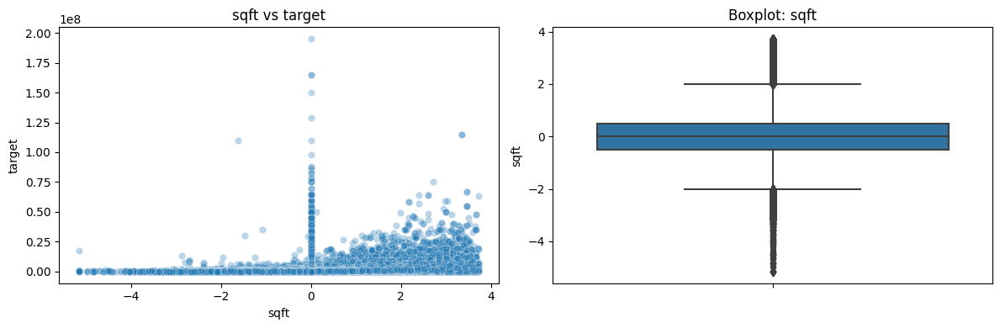

bath_count


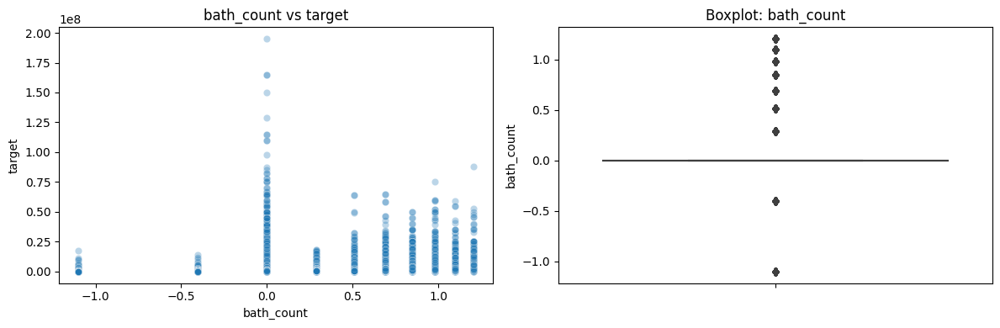

lot_size_sqft


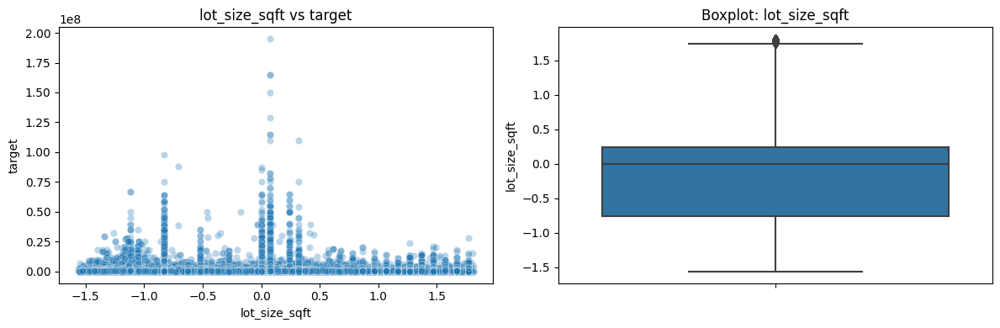

price_per_sqft


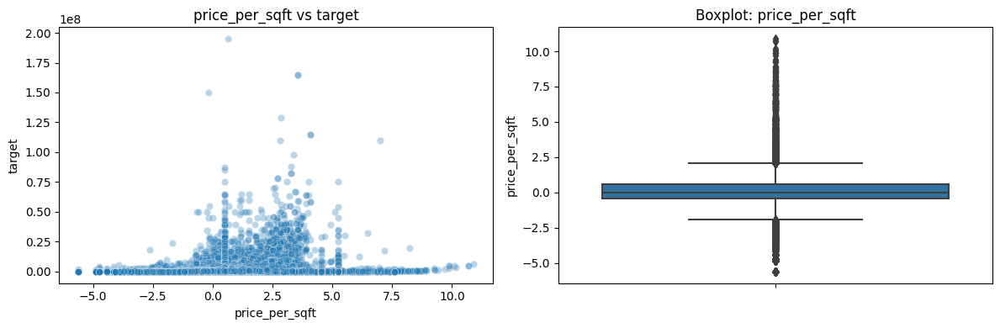

age


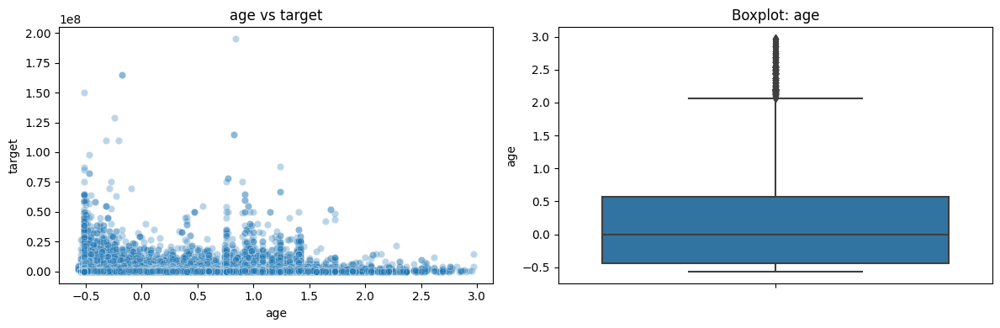

cooling_cod


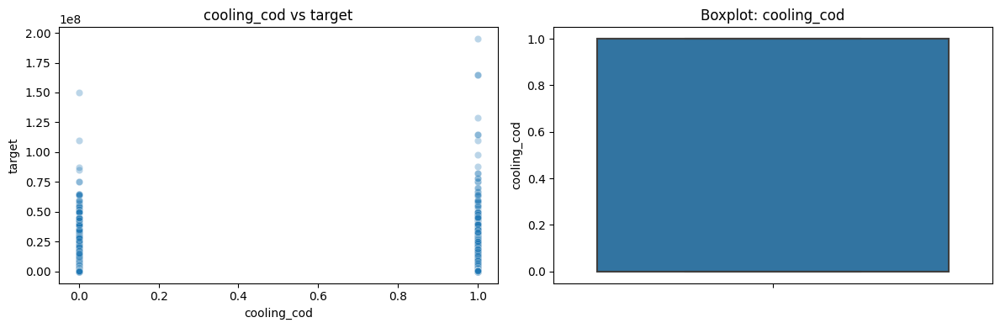

heat_baseboard


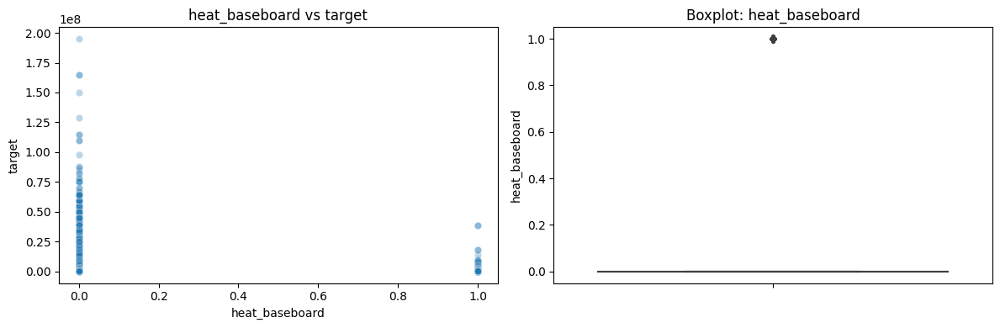

heat_central


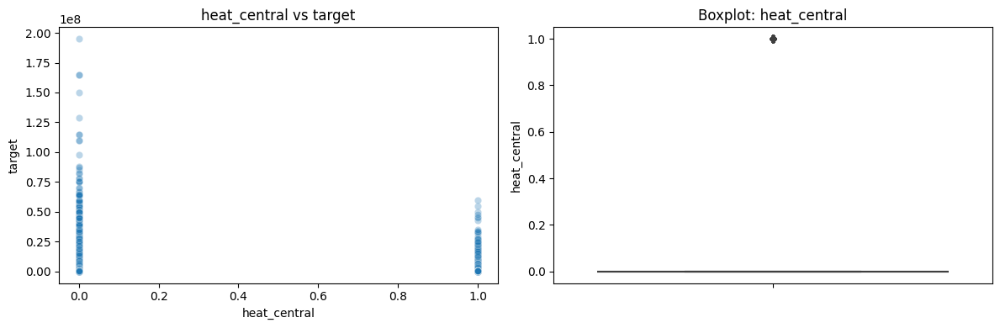

heat_electric


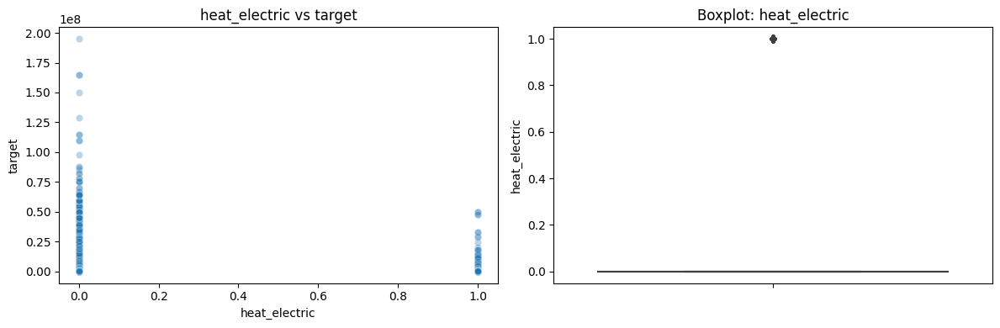

heat_forced_air


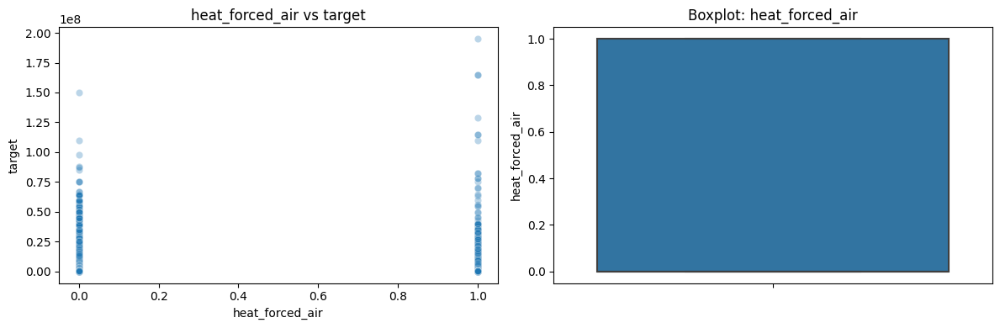

heat_gas


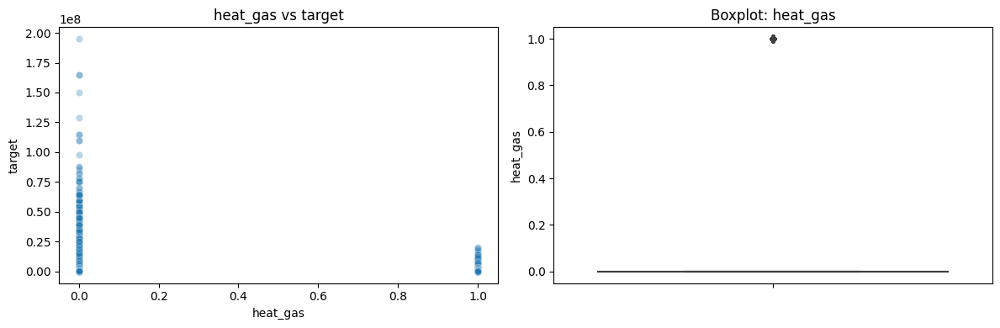

heat_heat_pump


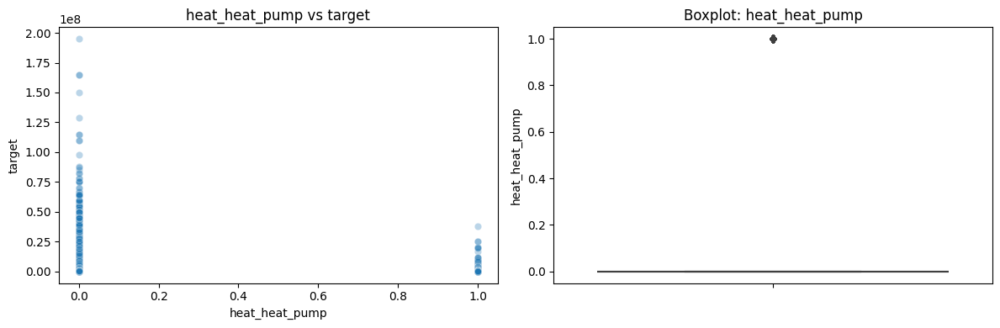

heat_oil


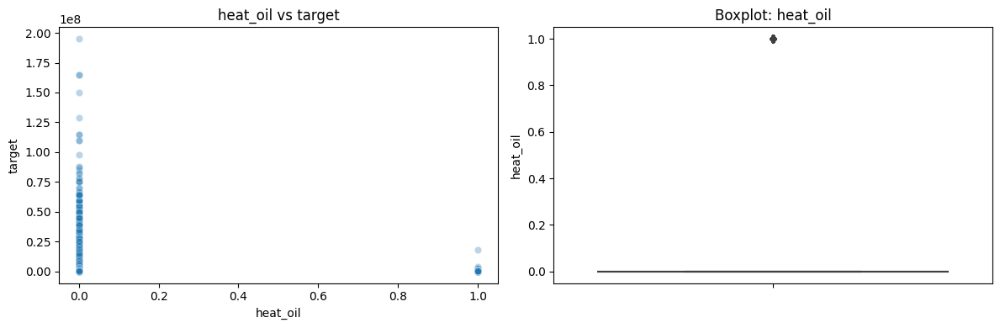

heat_other


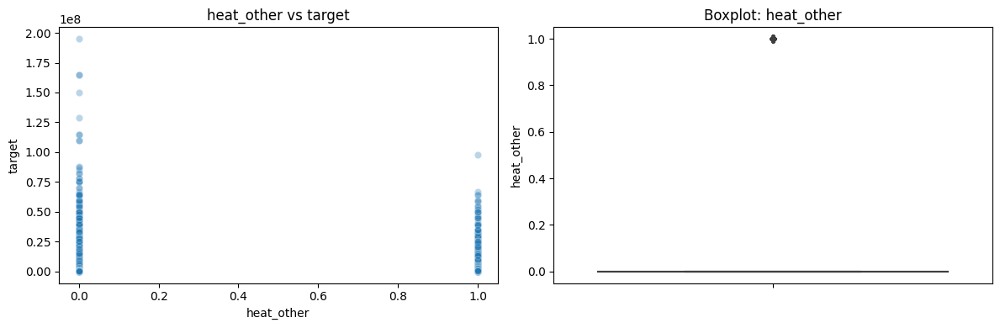

heat_radiant


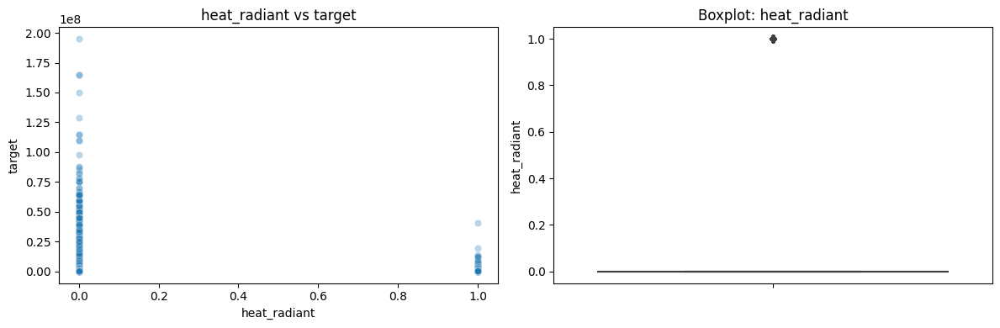

heat_refrigeration


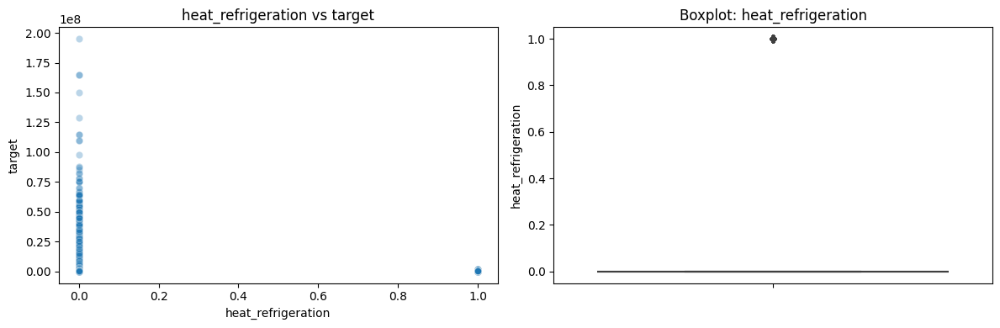

heat_unknown


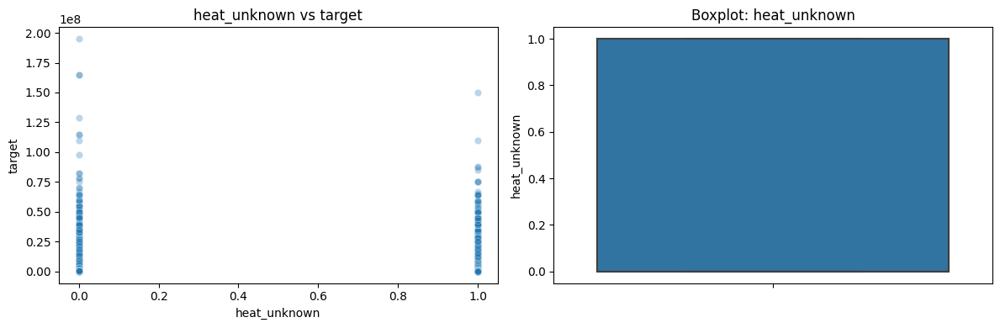

heat_wall


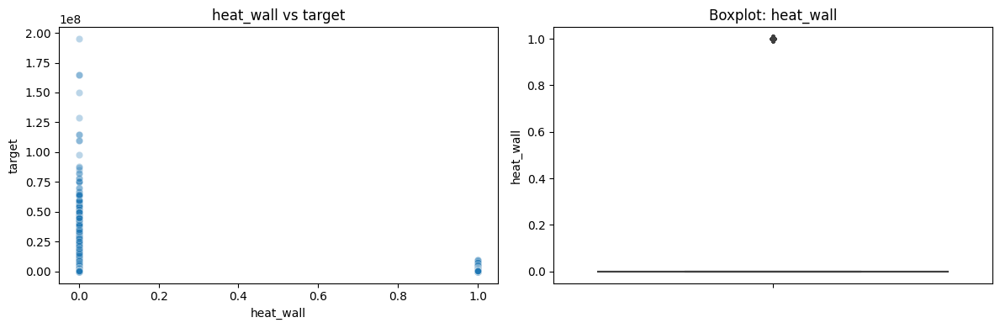

avg_school_rating


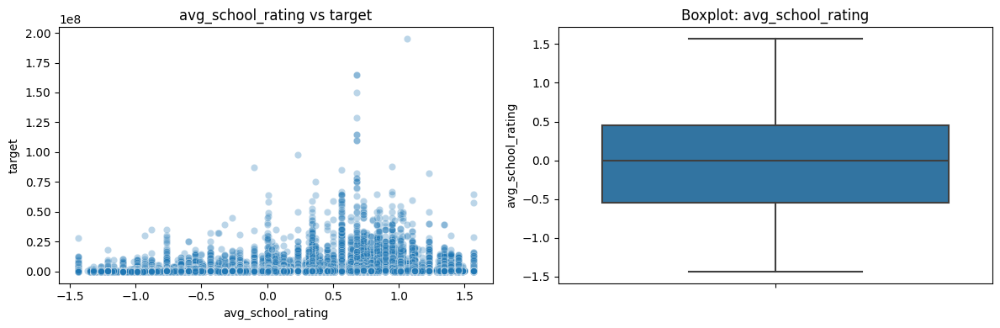

avg_school_distance


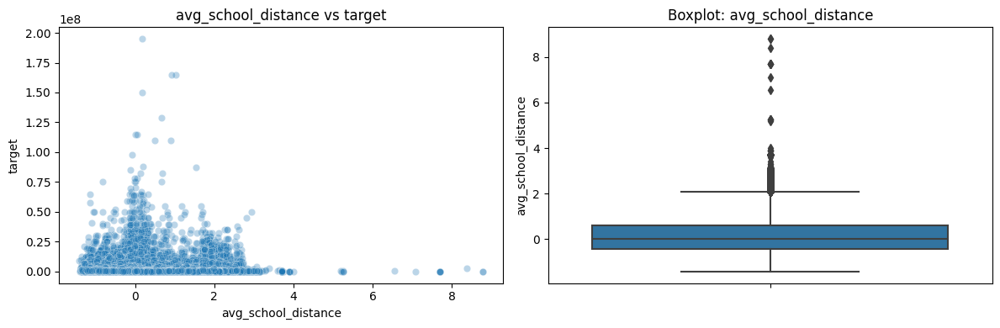

high_rating_count


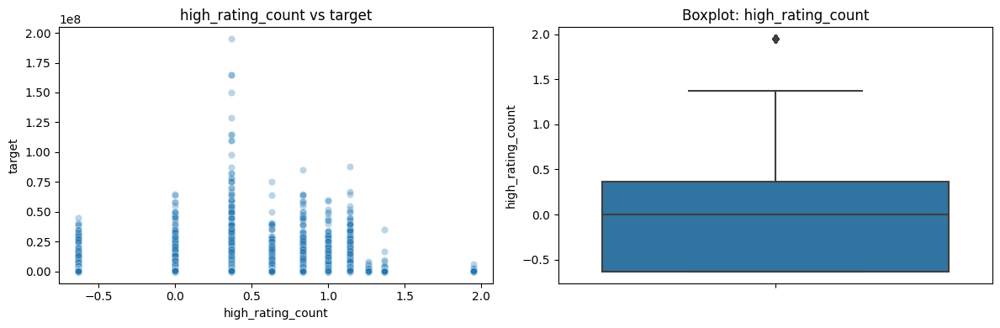

low_rating_count


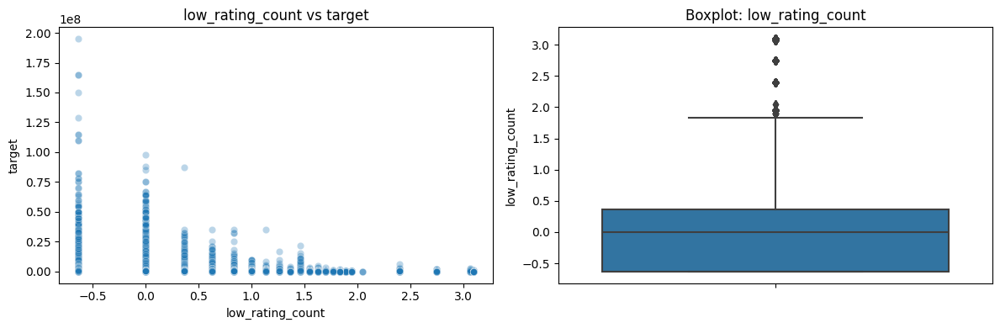

good_to_bad_ratio


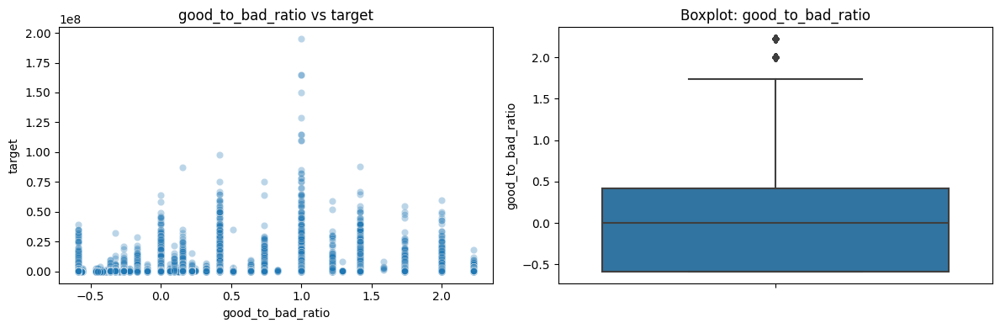

latitude


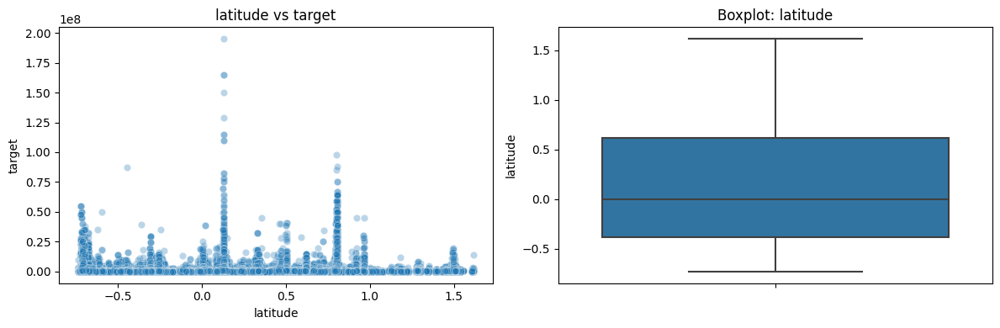

longitude


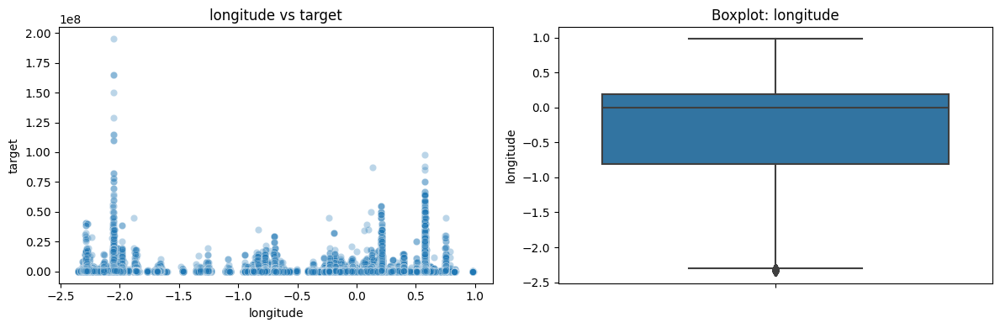

distance_to_state_capital


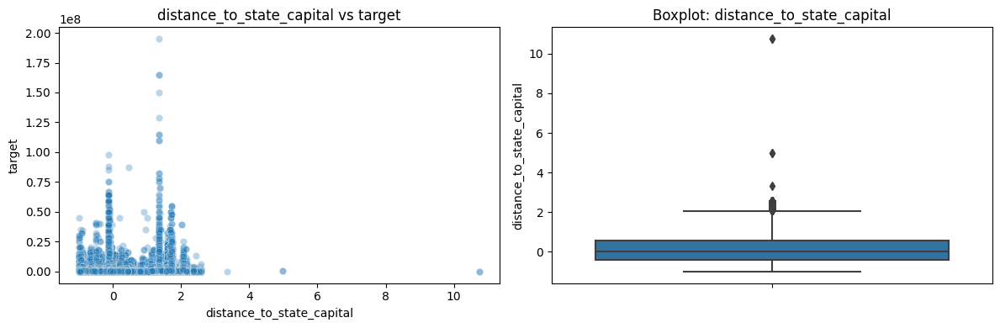

state_encoded


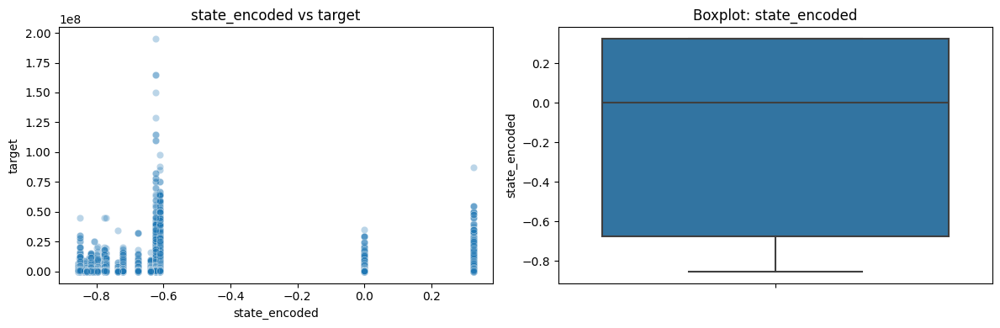

status_category_encoded


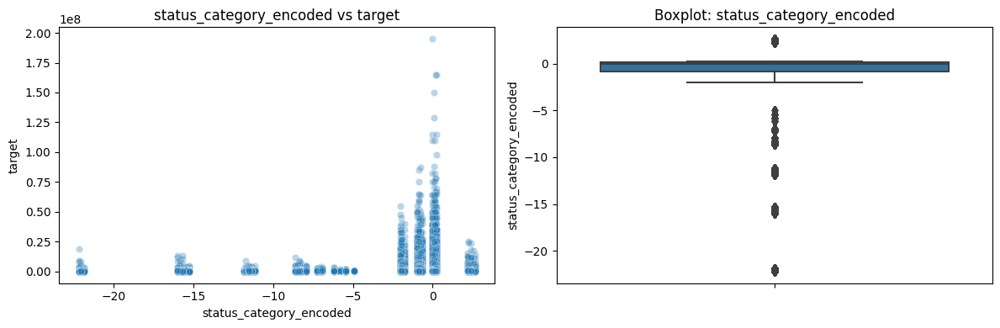

property_type_main_encoded


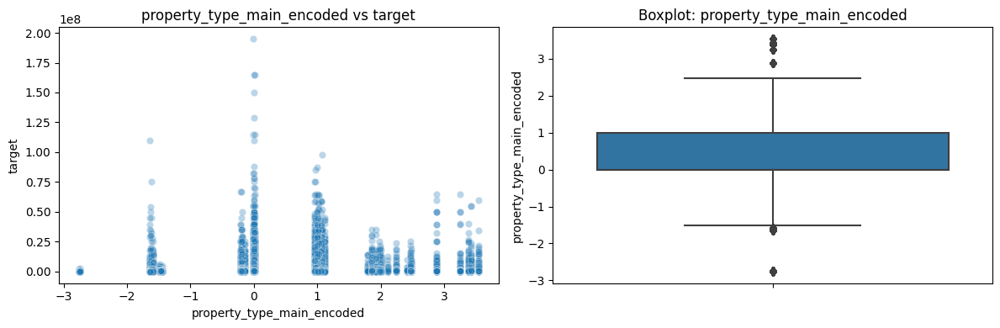

property_type_style_encoded


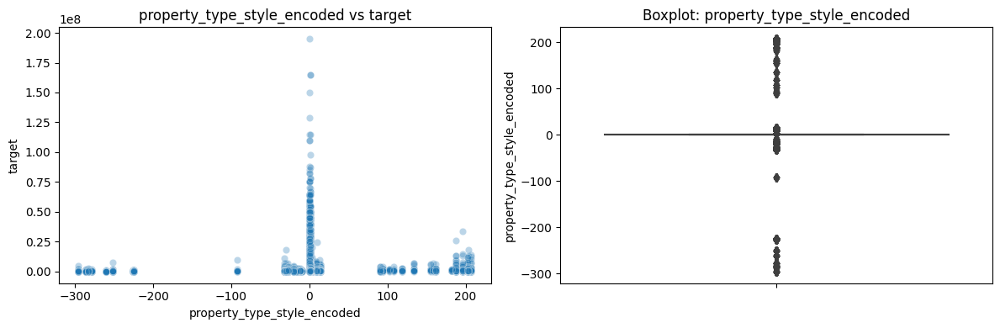

city_size_category_encoded


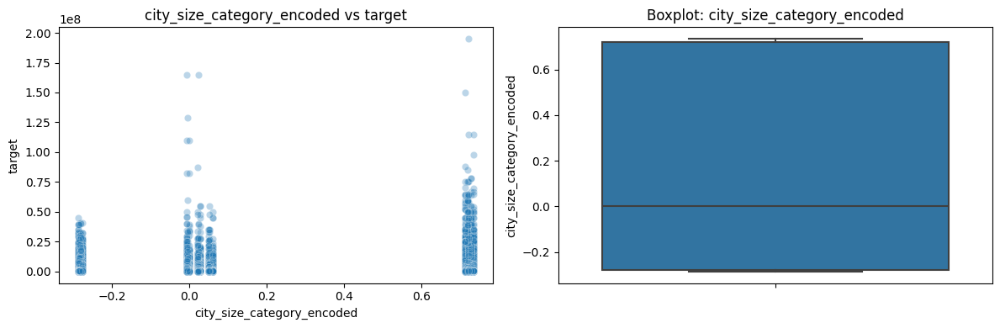

In [67]:
def visualize_all_numeric_seaborn(df, target='target', exclude=None):
    """
    Визуализирует scatter + boxplot для всех числовых признаков, кроме целевого и исключенных.

    Параметры:
        df (pd.DataFrame): датафрейм с данными
        target (str): имя целевой переменной
        exclude (list): список признаков, которые нужно исключить
    """
    if exclude is None:
        exclude = []

    numeric_cols = df.select_dtypes(include='number').columns
    features = [col for col in numeric_cols if col not in exclude + [target]]

    print(f"Визуализируем {len(features)} признаков...\n")

    for feature in features:
        print(f"{feature}")
        try:
            plot_feature_vs_target_seaborn(df, feature=feature, target=target)
        except Exception as e:
            print(f"⚠️ Ошибка при визуализации {feature}: {e}")
            
            
visualize_all_numeric_seaborn(data_norm)

По рисункам слева можно наблюдать, что ни у одного из признаков нет визуальной сильной линейной зависимости с целевым признаком. Справа по коробчатым диаграммам можно наблюдать, что некоторые признаки содержат выбросы. Сохраним нормализованные данные для моделей типа регресии. 

In [68]:
data_norm.to_csv('data_norm.csv')

Проверим мультиколлиниарность признаков 

c:\Users\nik-e\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\matrix.py:260: FutureWarning:

Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior



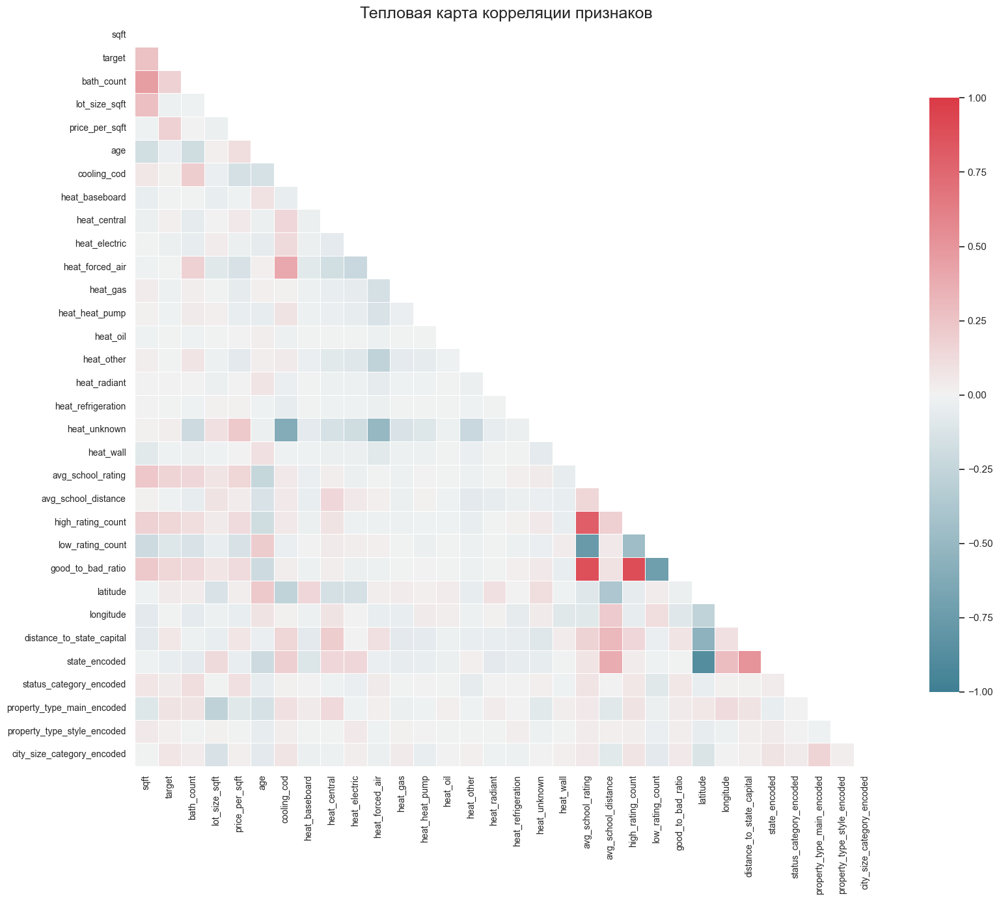


Сильно коррелирующие признаки (|corr| > 0.8)
             Feature 1          Feature 2  Correlation
442  high_rating_count  good_to_bad_ratio     0.895078
421  avg_school_rating  good_to_bad_ratio     0.883214
470           latitude      state_encoded    -0.878503
419  avg_school_rating  high_rating_count     0.801423


In [69]:
def plot_multicollinearity_heatmap(df, threshold=0.8):
    """
    Строит тепловую карту корреляции между числовыми признаками с метками и аннотациями.
    
    :param df: pandas DataFrame
    :param threshold: float, порог сильной корреляции (для визуального анализа)
    """
    # 1. Оставляем только числовые признаки
    num_df = df.select_dtypes(include=[np.number])
    
    # 2. Корреляционная матрица
    corr_matrix = num_df.corr()

    # 3. Построение heatmap
    plt.figure(figsize=(18, 14))
    sns.set(style="white")

    # Маска для верхней части треугольника
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

    # Цветовая карта
    cmap = sns.diverging_palette(220, 10, as_cmap=True)

    # Тепловая карта
    sns.heatmap(corr_matrix,
                mask=mask,
                cmap=cmap,
                vmax=1.0, vmin=-1.0,
                center=0,
                square=True,
                annot=True,
                fmt=".2f",
                linewidths=0.5,
                cbar_kws={"shrink": 0.8})

    plt.title("Тепловая карта корреляции признаков", fontsize=18)
    plt.xticks(rotation=90, ha='center', fontsize=10)
    plt.yticks(rotation=0, fontsize=10)
    plt.tight_layout()
    plt.show()

    # 4. (Опционально) Найти и вывести пары с высокой корреляцией
    print("\nСильно коррелирующие признаки (|corr| > {})".format(threshold))
    correlated_pairs = (
        corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
        .stack()
        .reset_index()
    )
    correlated_pairs.columns = ["Feature 1", "Feature 2", "Correlation"]
    strong_corr = correlated_pairs[correlated_pairs["Correlation"].abs() > threshold]
    print(strong_corr.sort_values(by="Correlation", key=abs, ascending=False))


# Например, если у тебя целевая переменная 'target':
plot_multicollinearity_heatmap(data_norm)


Анализ пар

Пара 1:

high_rating_count ↔ good_to_bad_ratio (коэффициент корреляции 0.895)

    high_rating_count — абсолютное количество школ с высоким рейтингом;

    good_to_bad_ratio — относительный показатель: соотношение хороших к плохим.

Вывод:

    good_to_bad_ratio информативнее, так как учитывает и хорошие, и плохие оценки, то есть нормирует информацию.

    high_rating_count может быть большим просто из-за размера города.

Оставить: good_to_bad_ratio
Удалить: high_rating_count

Пара 2:

avg_school_rating ↔ good_to_bad_ratio (коэффициент 0.883)

    avg_school_rating — средняя оценка;

    good_to_bad_ratio — уже выбран как основной выше.

Пара 3:

latitude ↔ state_encoded (коэффициент -0.879)

    latitude — географическая широта, непрерывная;

    state_encoded — закодированный номер штата (категория → число).

Вывод:

    state_encoded — не интерпретируемый числовой признак (в нашем случае отражает моду по штатам); (Оставим так как в данном случае более информативный)

    latitude — физический, непрерывный, интерпретируемый и легко масштабируемый (Был получен не самым точным образом)

In [70]:
data_norm_DelMK = data_norm.drop(['high_rating_count', 'avg_school_rating', 'latitude'], axis=1)
data_norm_DelMK.to_csv('data_norm_DelMK.csv')

На этом этап EDA считается завершенным далее перейдем к обучению